# GRAPHS

In [154]:
from graph_tool.all import sfdp_layout,graph_draw
import graph_tool as gt 
import geopandas as gpd
import networkx as nx
import momepy
import os
import time
import numpy as np
import matplotlib.pyplot as plt
mother_dir = os.chdir('..')



def graph_from_geojson(filename,node_col_front,node_col_tail,edge_col,prop_edge_col):
    '''
        Input:
            filename: string -> name.geojson
            name of node column front: string
            name of node column tail: string
            name of edge column
            name of property column
        Output:
            graph-tool graph
    '''
    gdf = gpd.read_file(filename)
    G = Graph()
    G.add_edge_list(gdf[[node_col_front,node_col_tail]].values)
    v_number_people_prop = G.new_vertex_property('int')
    G.vp['number_people'] = v_number_people_prop
    id_prop = G.new_edge_property('int')
    G.ep['id'] = id_prop
    length_prop = G.new_edge_property('float')
    G.ep['length'] = length_prop
    for v,uv in G.items():
        uv['id'] = gdf[gdf[node_col_front] == e.source()][gdf[node_col_tail] == e.target()][edge_col].values[0]
        uv['length'] = gdf[gdf[node_col_front] == e.source()][gdf[node_col_tail] == e.target()][prop_edge_col].values[0]
        v['number_people'] = np.random(1)
    return G

def _generate_uniform_distribution_nodes_in_space(number_nodes = 100, radius_city = 10,p = 0.7):  
    '''
        Generate a uniform distribution of points in a circle of radius radius_city
        Initialize postiions and distance matrix
    '''  
    from scipy.spatial import distance_matrix
    G = gt.Graph()
    nodes_r = np.random.random(number_nodes)
    nodes_costeta = 2*np.random.random(number_nodes) - 1      
    x = nodes_r*(radius_city)*nodes_costeta
    y = nodes_r*(radius_city)*np.sqrt(1-nodes_costeta**2)  
    points_in_space = np.array([x,y]).T 
    position_vertex = G.new_vertex_property('vector<double>')
    id_vertex = G.new_vertex_property('int')
    print('initializing id vertex')
    for i in range(len(x)):
        G.add_vertex()
        id_vertex[G.vertex(i)] = i
    print('initializing position vertex')
    for node_position in range(len(points_in_space)):
        position_vertex[G.vertex(node_position)] = points_in_space[node_position] 
    G.vp['position'] = position_vertex
    G.vp['id'] = id_vertex
    for i in range(number_nodes):
        for j in range(number_nodes):
            if j !=i:
                if p < np.random.rand():
                    G.add_edge(i,j)
    print('calculating distance matrix')
    distance_matrix_ = distance_matrix(points_in_space,points_in_space)
    unweighted_edge = G.new_edge_property('int')
    length_edge = G.new_edge_property('float')
    print('initializing edge properties')
    for edge in G.edges():
        length_edge[edge] = distance_matrix_[int(edge.source())][int(edge.target())]
        unweighted_edge[edge] = 1
    G.ep['length'] = length_edge
    G.ep['unweighted'] = unweighted_edge
    return G

def distribution_edges(g):
    '''
        Citation: The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Figure (1)
    '''
#    A = gt.spectral.adjacency(g)
#    print(A.getnnz())
#    list_degrees = []
#    for i in range(len(A)):
#        list_degrees.append(np.sum(A[i]))
    gt.stats.edge_hist(g,deg='unweighted')
    n,bins = np.histogram(list_degrees)
    
    plt.plot(bins[:-1],n)
    plt.xlabel('Degree')
    plt.ylabel('Number of nodes')
    plt.show()

def dimension_graph(g):
    '''
        Citation: The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Figure (2)
    '''
    
    dist_ = gt.topology.shortest_distance(g)
    diameter_ = _get_diameter_graph(dist,g)
    number_vertices = len(g.vp['id'].get_array())
    list_N_vr = np.zeros((len(g.vp['id'].get_array()),diameter_+1))
    list_r = np.arange(diameter_+1)
    for r in range(diameter_+1):
        print('r: ',r)
        for vertex in g.vertices():
            pos = np.where(dist_[vertex].a == r)
            print('pos:\n',pos)
            Nv_r = len(pos)
            list_N_vr[g.vp['id'][vertex]][r] = Nv_r
    Avg_Nv_r = np.sum(list_N_vr,axis=0)/len(g.vp['id'].get_array())
    print('avg Nv',np.shape(Avg_Nv_r),' ',Avg_Nv_r)
    print('r',np.shape(list_r),' ',list_r)
    fig,ax = plt.subplots(1,1,figsize=(12,6))
    ax.plot(list_r,Avg_Nv_r)
    ax.set_xlabel('r')
    ax.set_ylabel('$\langle N_v(r) \rangle$')
    ax.set_xscale('log')
    ax.set_yscale('log')
    plt.show()

def _get_diameter_graph(dist,g):
    '''
        Given a graph-tool graph, and already computed shortest distance ,return the diameter of the graph
    '''
    diameter_ = 0
    for vertex in g.vertices():
        for vertex_ in g.vertices():
            if dist[vertex].a[G.vp['id'][vertex_]] > diameter_:
                diameter_ = dist[vertex].a[G.vp['id'][vertex_]]
    print('diameter: ',diameter_)
    return diameter_


/home/aamad/anaconda3/envs/gt/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [155]:
print(mother_dir)
G = _generate_uniform_distribution_nodes_in_space()
print('fraction of complete graph',G.num_edges()/(G.num_vertices()*(G.num_vertices()-1)))
#pos = sfdp_layout(G)
#graph_draw(G,pos = pos,cooling_step = 1.01,epsilon = 1)
dimension_graph(G)
dist = gt.topology.shortest_distance(G)
print(dist[0].get_array())
distribution_edges(G)


None
initializing id vertex
initializing position vertex
calculating distance matrix
initializing edge properties
fraction of complete graph 0.3056565656565657


NameError: name 'dist' is not defined

In [ ]:
os.environ.keys()

KeysView(environ({'BAMF_DESKTOP_FILE_HINT': '/var/lib/snapd/desktop/applications/code_code.desktop', 'CHROME_DESKTOP': 'code-url-handler.desktop', 'CONDA_DEFAULT_ENV': 'gt', 'CONDA_EXE': '/home/aamad/anaconda3/bin/conda', 'CONDA_PREFIX': '/home/aamad/anaconda3/envs/gt', 'CONDA_PROMPT_MODIFIER': '(gt) ', 'CONDA_PYTHON_EXE': '/home/aamad/anaconda3/bin/python', 'CONDA_SHLVL': '2', 'DBUS_SESSION_BUS_ADDRESS': 'unix:path=/run/user/1000/bus', 'DESKTOP_SESSION': 'ubuntu', 'DISPLAY': 'localhost:0.0', 'ELECTRON_NO_ATTACH_CONSOLE': '1', 'GDK_BACKEND': 'x11', 'GDK_PIXBUF_MODULEDIR': '/snap/code/143/usr/lib/x86_64-linux-gnu/gdk-pixbuf-2.0/2.10.0/loaders', 'GDK_PIXBUF_MODULE_FILE': '/home/aamad/snap/code/common/.cache/gdk-pixbuf-loaders.cache', 'GDMSESSION': 'ubuntu', 'GIO_LAUNCHED_DESKTOP_FILE': '/var/lib/snapd/desktop/applications/code_code.desktop', 'GIO_LAUNCHED_DESKTOP_FILE_PID': '5155', 'GIO_MODULE_DIR': '/home/aamad/snap/code/common/.cache/gio-modules', 'GJS_DEBUG_OUTPUT': 'stderr', 'GJS_DEB

# IMAGINARY NUMBERS
## .imag is 1 order of magnitude faster than np.imag

# DISTANCE MATRIX COMPUTATION
## Lesson: scipy distance is better than numpy distance [to return a distance matrix, but not by far]

In [ ]:
import numpy as np
import scipy.spatial as sp
import time
x = np.random.rand(10000)
print(np.shape(x))
y = np.random.rand(10000)
X = np.array([x,y]).T
print('shape of X: ',X.shape)
t0 = time.time()
d = sp.distance_matrix(X,X)
t1 = time.time()
print('scipy distance: ',t1-t0)
t0 = time.time()
x2 = np.sum(X**2, axis=1) # shape of (m)
y2 = np.sum(X**2, axis=1) # shape of (n)
xy = np.matmul(X, X.T)
x2 = x2.reshape(-1, 1)
dists = np.sqrt(x2 - 2*xy + y2) # (m
t1 = time.time()
print('numpy distance: ',t1-t0)

(10000,)
shape of X:  (10000, 2)
scipy distance:  0.956500768661499
numpy distance:  1.1910429000854492


/tmp/ipykernel_3022/3403174643.py:18: RuntimeWarning: invalid value encountered in sqrt
  dists = np.sqrt(x2 - 2*xy + y2) # (m


# NEWMAN 2D graph

# BARTHELEMY

,SAMPN,PERNO,origin,destination,dep_time,origin_osmid,destination_osmid
0,1,1,61348072,61339862,420,61348072,61339862
1,1,1,994058431,61370193,480,994058431,61370193
2,1,1,61465799,61605861,540,61465799,61605861
3,1,1,61348202,61339756,600,61348202,61339756
4,1,1,61340395,61340682,660,61340395,61340682
...,...,...,...,...,...,...,...
43213,191299,191299,61517900,8642889090,600,61517900,8642889090
43214,191299,191299,63522790,8642889090,660,63522790,8642889090
43215,191299,191299,61468640,61340886,720,61468640,61340886
43216,191299,191299,1627853204,61363595,780,1627853204,61363595


# ROAD NETWORK OSMNX

Edge: (30730954, 61441677), Attributes: {'osmid': 197230699, 'oneway': True, 'lanes': '2', 'highway': 'residential', 'maxspeed': '25 mph', 'reversed': False, 'length': 33.071999999999996, 'geometry': <LINESTRING (-71.022 42.368, -71.022 42.368, -71.022 42.368, -71.022 42.368)>}
Edge: (30730954, 1102741801), Attributes: {'osmid': 197230701, 'highway': 'residential', 'maxspeed': '25 mph', 'oneway': False, 'reversed': False, 'length': 278.885, 'geometry': <LINESTRING (-71.022 42.368, -71.022 42.368, -71.022 42.368, -71.022 42.367,...>}
Edge: (61178875, 61356567), Attributes: {'osmid': [8649976, 8644633, 1196171459, 1196171460], 'lanes': '2', 'name': ['Crescent Street', 'Roland Street'], 'highway': 'residential', 'maxspeed': '25 mph', 'width': ['9.8', '11.0'], 'oneway': False, 'reversed': [False, True], 'length': 160.44299999999998, 'geometry': <LINESTRING (-71.081 42.382, -71.081 42.382, -71.081 42.382, -71.081 42.382,...>}
Edge: (61178875, 61356798), Attributes: {'osmid': [426653648, 119

In [ ]:
import geopandas as gpd
path = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/BO/BOS.shp'
#path = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/SFO/SFO.shp'
#path = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/LA/LAX.shp'
df = gpd.read_file(path)
df

,tractid,my_area,geometry
0,630400,9.988907,"POLYGON ((-71.35236 41.93142, -71.35281 41.931..."
1,631100,8.289611,"POLYGON ((-71.35281 41.93117, -71.35236 41.931..."
2,631300,8.960974,"POLYGON ((-71.29017 41.94444, -71.29021 41.944..."
3,631200,17.019618,"POLYGON ((-71.30786 41.96025, -71.30804 41.959..."
4,631400,0.790492,"POLYGON ((-71.29125 41.94414, -71.29094 41.944..."
...,...,...,...
969,260700,2.537014,"POLYGON ((-71.11598 42.78340, -71.11584 42.783..."
970,260900,2.993848,"POLYGON ((-71.12079 42.76844, -71.12069 42.768..."
971,260800,0.941658,"POLYGON ((-71.09719 42.76304, -71.09696 42.764..."
972,261000,1.511648,"POLYGON ((-71.08517 42.76375, -71.08570 42.763..."


# DOWNLOADING NETWORK CITIES OF INTEREST

In [342]:
import networkx as nx
import osmnx as ox
import os
import geopandas as gpd
from shapely import intersection,box,Polygon,LineString,Point
from matplotlib import pyplot as plt
import shapely as shp
import numpy as np
import sys
import pandas as pd
from shapely.geometry import Point,Polygon,LineString
from collections import defaultdict

BO_polygon_file = '/home/aamad/Desktop/phd/berkeley/data/BOS/BOS.shp'
SF_polygon_file = '/home/aamad/Desktop/phd/berkeley/data/SFO/SFO.shp'
LAX_polygon_file = '/home/aamad/Desktop/phd/berkeley/data/LAX/LAX.shp'
RIO_polygon_file = '/home/aamad/Desktop/phd/berkeley/data/RIO/RIO.shp'
LIS_polygon_file = '/home/aamad/Desktop/phd/berkeley/data/LIS/LIS.shp'
#d = gpd.read_file('/home/aamad/Desktop/phd/berkeley/data/BOS/BOSnew.shp')


# BOSTON

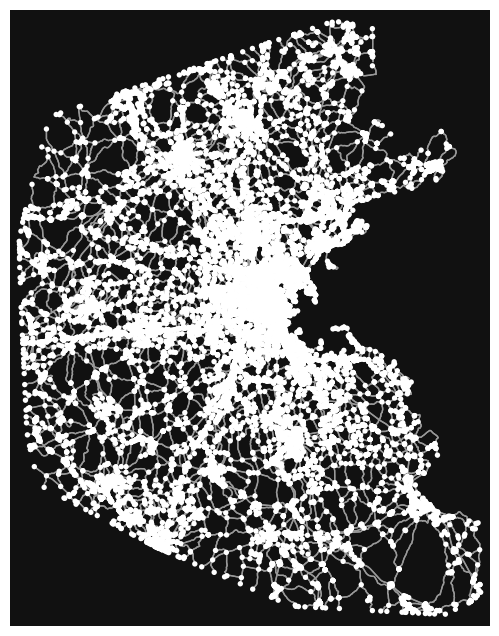

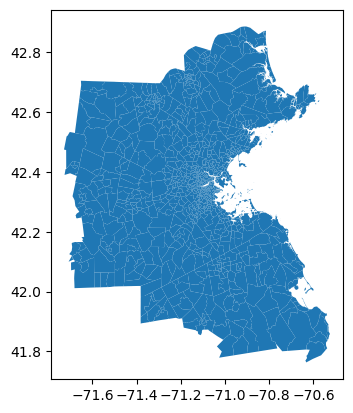

In [343]:
# SHAPE FILE: polygons covering the city
BO_polygon = gpd.read_file(BO_polygon_file)
# Cartography FROM SHAPE FILE
file_graphml = '/home/aamad/Desktop/phd/berkeley/data/carto/BOS/BOS_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    BO = ox.load_graphml(file_graphml)
else:
    BO = ox.graph_from_polygon(BO_polygon.unary_union,network_type='drive', simplify=False)

fig, ax = ox.plot_graph(BO)
BO_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/BOS/od_demand_7to8_R_1.fma'



In [344]:
BO_polygon

,tractid,my_area,geometry
0,630400,9.988907,"POLYGON ((-71.35236 41.93142, -71.35281 41.931..."
1,631100,8.289611,"POLYGON ((-71.35281 41.93117, -71.35236 41.931..."
2,631300,8.960974,"POLYGON ((-71.29017 41.94444, -71.29021 41.944..."
3,631200,17.019618,"POLYGON ((-71.30786 41.96025, -71.30804 41.959..."
4,631400,0.790492,"POLYGON ((-71.29125 41.94414, -71.29094 41.944..."
...,...,...,...
969,260700,2.537014,"POLYGON ((-71.11598 42.78340, -71.11584 42.783..."
970,260900,2.993848,"POLYGON ((-71.12079 42.76844, -71.12069 42.768..."
971,260800,0.941658,"POLYGON ((-71.09719 42.76304, -71.09696 42.764..."
972,261000,1.511648,"POLYGON ((-71.08517 42.76375, -71.08570 42.763..."


# SAN FRANCISCO

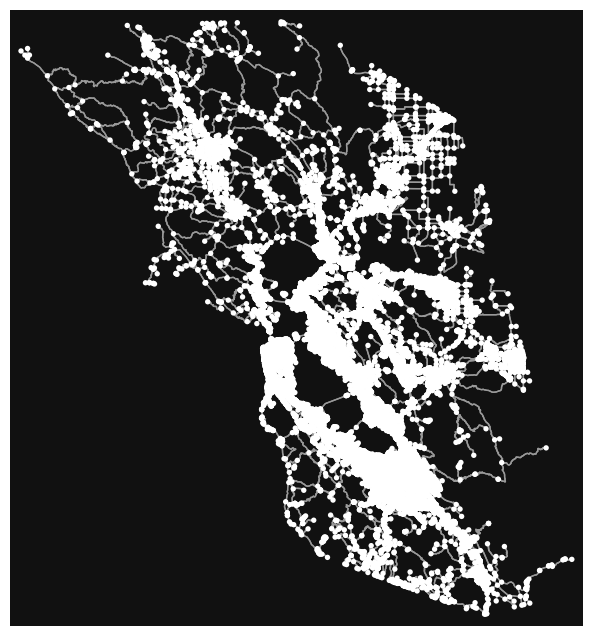

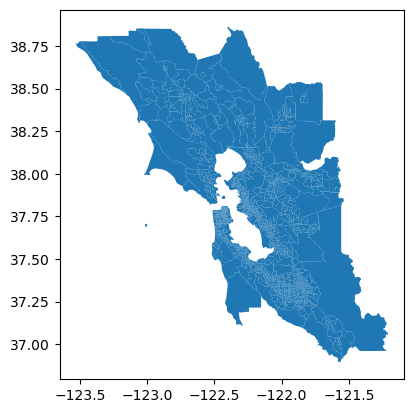

In [333]:
SF_polygon = gpd.read_file(SF_polygon_file)
file_graphml = '/home/aamad/Desktop/phd/berkeley/data/carto/SFO/SFO_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    SF = ox.load_graphml(filepath = file_graphml)
else:
    SF = ox.graph_from_polygon(SF_polygon.unary_union,network_type='drive', simplify=False)
fig, ax = ox.plot_graph(SF)
SF_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/SFO/od_demand_7to8_R_1.fma'



In [334]:
SF_polygon

,NAME,CENSUSAREA,LSAD,GEO_ID,COUNTY,STATE,TRACT,tractID,tractID_ne,geometry
0,4251.03,0.341,Tract,1400000US06001425103,001,06,425103,06001425103,1,"POLYGON ((-122.29236 37.84936, -122.28956 37.8..."
1,4251.04,0.415,Tract,1400000US06001425104,001,06,425104,06001425104,2,"POLYGON ((-122.27860 37.82854, -122.27806 37.8..."
2,4261,1.155,Tract,1400000US06001426100,001,06,426100,06001426100,3,"POLYGON ((-122.22808 37.83303, -122.22449 37.8..."
3,4271,0.396,Tract,1400000US06001427100,001,06,427100,06001427100,4,"POLYGON ((-122.22993 37.76006, -122.22969 37.7..."
4,4278,0.321,Tract,1400000US06001427800,001,06,427800,06001427800,5,"POLYGON ((-122.26353 37.76924, -122.26360 37.7..."
...,...,...,...,...,...,...,...,...,...,...
1580,4403.04,0.378,Tract,1400000US06001440304,001,06,440304,06001440304,1581,"POLYGON ((-122.08120 37.58757, -122.08118 37.5..."
1581,3892,0.096,Tract,1400000US06013389200,013,06,389200,06013389200,1582,"POLYGON ((-122.30618 37.89822, -122.30695 37.9..."
1582,4506.04,0.816,Tract,1400000US06001450604,001,06,450604,06001450604,1583,"POLYGON ((-121.87815 37.68889, -121.87784 37.6..."
1583,123.02,0.036,Tract,1400000US06075012302,075,06,012302,06075012302,1584,"POLYGON ((-122.40987 37.78715, -122.41297 37.7..."


# RIO

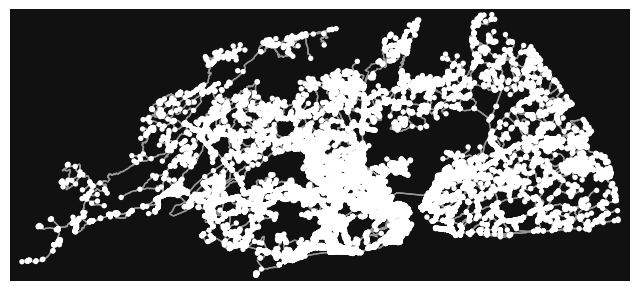

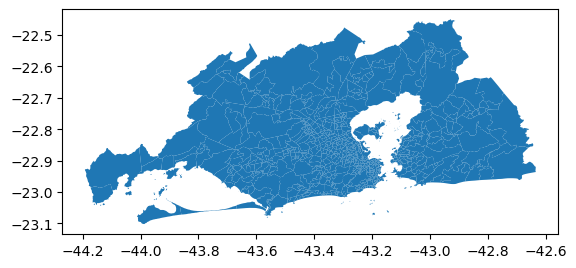

In [335]:
RIO_polygon = gpd.read_file(RIO_polygon_file)
file_graphml = '/home/aamad/Desktop/phd/berkeley/data/carto/RIO/RIO_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    RIO = ox.load_graphml(filepath = file_graphml)
else:
    RIO = ox.graph_from_polygon(SF_polygon.unary_union,network_type='drive', simplify=False)
fig, ax = ox.plot_graph(RIO)
RIO_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/RIO/od_demand_7to8_R_1.fma'



In [336]:
RIO_polygon

,Zona,Area,geometry
0,1.0,0.431999,"POLYGON ((-43.18728 -22.89789, -43.18726 -22.8..."
1,10.0,0.517468,"POLYGON ((-43.18348 -22.92862, -43.18338 -22.9..."
2,100.0,3.157796,"POLYGON ((-43.20465 -22.96343, -43.20419 -22.9..."
3,101.0,0.531223,"POLYGON ((-43.20136 -22.96076, -43.20101 -22.9..."
4,102.0,0.328147,"POLYGON ((-43.20424 -22.96031, -43.20412 -22.9..."
...,...,...,...
725,95.0,0.469361,"POLYGON ((-43.20699 -22.98253, -43.20702 -22.9..."
726,96.0,0.463444,"POLYGON ((-43.22165 -22.98824, -43.22210 -22.9..."
727,97.0,0.468069,"POLYGON ((-43.22524 -22.98061, -43.22505 -22.9..."
728,98.0,0.612884,"POLYGON ((-43.21945 -22.97675, -43.21909 -22.9..."


# LAX

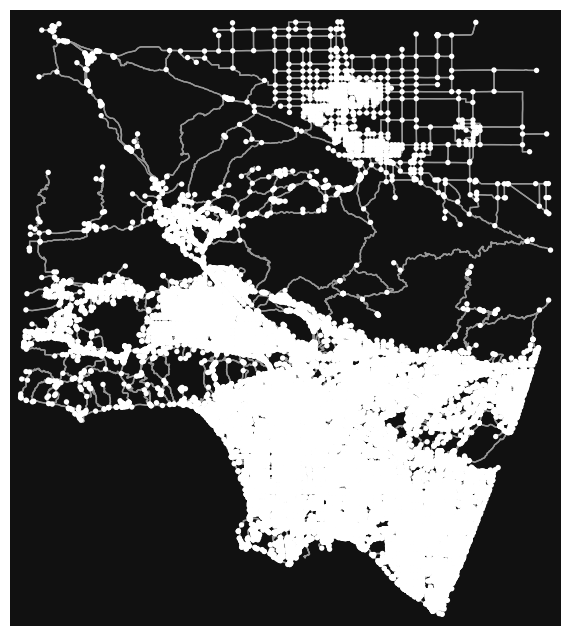

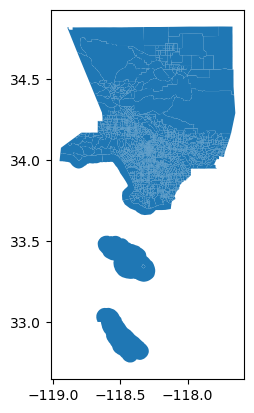

In [337]:
LAX_polygon = gpd.read_file(LAX_polygon_file)
file_graphml = '/home/aamad/Desktop/phd/berkeley/data/carto/LAX/LAX_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    LAX = ox.load_graphml(filepath = file_graphml)
else:
    LAX = ox.graph_from_polygon(LAX_polygon.unary_union,network_type='drive', simplify=False)
fig, ax = ox.plot_graph(LAX)
LAX_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/LAX/od_demand_7to8_R_1.fma'



In [338]:
LAX_polygon

,slug,set,kind,external_i,name,display_na,INTPTLAT,NAME_1,INTPTLON,FUNCSTAT,GEOID,AWATER,COUNTYFP,NAMELSAD,MTFCC,TRACTCE,STATEFP,ALAND,geometry
0,06037101110-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101110,1011.10,06037101110 Census Tract (2012),+34.2594737,None,-118.2929869,S,06037101110,0,037,Census Tract 1011.10,G5020,101110,06,1142405,"POLYGON ((-118.30229 34.25870, -118.30079 34.2..."
1,06037101122-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101122,1011.22,06037101122 Census Tract (2012),+34.2677213,None,-118.2901465,S,06037101122,0,037,Census Tract 1011.22,G5020,101122,06,2644042,"POLYGON ((-118.30333 34.27354, -118.30318 34.2..."
2,06037101210-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101210,1012.10,06037101210 Census Tract (2012),+34.2529724,None,-118.2907309,S,06037101210,0,037,Census Tract 1012.10,G5020,101210,06,650691,"POLYGON ((-118.29945 34.25598, -118.28592 34.2..."
3,06037101220-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101220,1012.20,06037101220 Census Tract (2012),+34.2516085,None,-118.2816322,S,06037101220,0,037,Census Tract 1012.20,G5020,101220,06,698969,"POLYGON ((-118.28592 34.24896, -118.28592 34.2..."
4,06037101300-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101300,1013,06037101300 Census Tract (2012),+34.2487732,None,-118.2709976,S,06037101300,0,037,Census Tract 1013,G5020,101300,06,2581129,"POLYGON ((-118.27247 34.23253, -118.27194 34.2..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2341,06037980031-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037980031,9800.31,06037980031 Census Tract (2012),+33.7338344,None,-118.2627274,S,06037980031,13318970,037,Census Tract 9800.31,G5020,980031,06,12598244,"POLYGON ((-118.28530 33.70860, -118.28337 33.7..."
2342,06037980033-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037980033,9800.33,06037980033 Census Tract (2012),+33.7443155,None,-118.2203101,S,06037980033,16041385,037,Census Tract 9800.33,G5020,980033,06,12678792,"POLYGON ((-118.24463 33.71077, -118.23180 33.7..."
2343,06037990100-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037990100,9901,06037990100 Census Tract (2012),+33.9991909,None,-118.7921876,S,06037990100,172776519,037,Census Tract 9901,G5020,990100,06,0,"POLYGON ((-118.95114 33.99643, -118.95056 34.0..."
2344,06037990200-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037990200,9902,06037990200 Census Tract (2012),+33.9135868,None,-118.4928693,S,06037990200,207469766,037,Census Tract 9902,G5020,990200,06,0,"POLYGON ((-118.63168 34.00001, -118.63598 34.0..."


# LIS

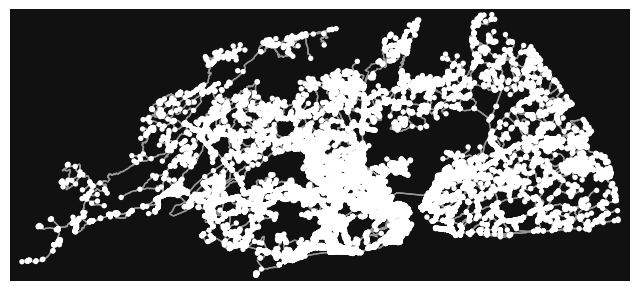

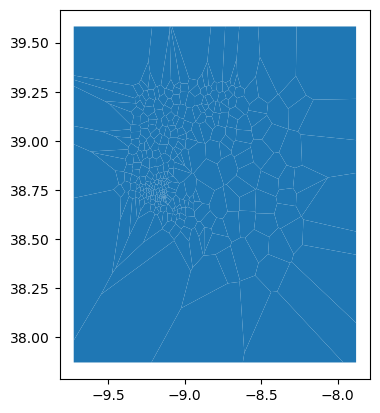

In [208]:
LIS_polygon = gpd.read_file(LIS_polygon_file)
file_graphml = '/home/aamad/Desktop/phd/berkeley/data/carto/LIS/LIS_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    LIS = ox.load_graphml(filepath = file_graphml)
else:
    LIS = ox.graph_from_polygon(SF_polygon.unary_union,network_type='drive', simplify=False)
fig, ax = ox.plot_graph(RIO)
LIS_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/LIS/od_demand_7to8_R_1.fma'



# MAPPING 

In [ ]:


def polygon2origin_destination(gdf,carto):
    '''
        Given a network taken from the cartography or ours:
            Build the set of origin and destinations from the polygons that are coming from the 
            geodataframe.
        
    '''
    polygon2origindest = defaultdict(list)
    for node in carto.nodes():
        containing_polygon = gdf.geometry.apply(lambda x: x.contains(Point(carto.nodes[node]['x'],carto.nodes[node]['y'])))
#        print('containing_polygon: ',containing_polygon)
        idx_containing_polygon = gdf[containing_polygon].index
#        print('idx_containing_polygon: ',idx_containing_polygon)

        tract_id = gdf.loc[idx_containing_polygon]['tractid']
        if len(tract_id)==1: 
            tract_id = tract_id.tolist()[0]
#            print('tract_id: ',tract_id)
            polygon2origindest[tract_id].append(node)
        elif len(tract_id)>1:
            raise ValueError('more than one tract id: THIS IS STRANGE')
        else:
            pass

    return polygon2origindest


def OD_from_fma(file,
                polygon2origindest,
                offset = 6,
                seconds_in_minute = 60,
                start_hour = 7
                ):
    '''
        Each fma file contains the origin and destinations with the rate of people entering the graph.
        This function, takes advantage of the polygon2origindest dictionary to build the origin and destination
        selecting at random one of the nodes that are contained in the polygon.
    '''
    users_id = []
    time_ = []
    origins = []
    destinations = []
    with open(file) as infile:
        count_line = 0
        for line in infile:
            count_line += 1
            if count_line > offset:
                tok = line.split(' ')
                origin = int(tok[0])
                destination = int(tok[1])
                number_people = int(float(tok[2].split('\n')[0]))
                bin_width = 1
                iterations = number_people/bin_width            
                if number_people > 0:
                    for it in range(int(iterations)):
                        if len(polygon2origindest[destination])>0 and len(polygon2origindest[origin])>0:
                            users_id.append(count_line-offset)
                            time_.append(start_hour*seconds_in_minute + it*seconds_in_minute)
                            i = np.random.randint(0,len(polygon2origindest[origin]))
                            origins.append(polygon2origindest[origin][i])
                            i = np.random.randint(0,len(polygon2origindest[destination]))                        
                            destinations.append(polygon2origindest[destination][i])
    df1 = pd.DataFrame({
        'SAMPN':users_id,
        'PERNO':users_id,
        'origin':origins,
        'destination':destinations,
        'dep_time':time_,
        'origin_osmid':origins,
        'destination_osmid':destinations
        })
    return df1


BO_pol2od = polygon2origin_destination(df,BO)
OD_ti_BO = OD_from_fma(file,BO_pol2od)


      Zona      Area                                           geometry
0      1.0  0.431999  POLYGON ((-43.18728 -22.89789, -43.18726 -22.8...
1     10.0  0.517468  POLYGON ((-43.18348 -22.92862, -43.18338 -22.9...
2    100.0  3.157796  POLYGON ((-43.20465 -22.96343, -43.20419 -22.9...
3    101.0  0.531223  POLYGON ((-43.20136 -22.96076, -43.20101 -22.9...
4    102.0  0.328147  POLYGON ((-43.20424 -22.96031, -43.20412 -22.9...
..     ...       ...                                                ...
725   95.0  0.469361  POLYGON ((-43.20699 -22.98253, -43.20702 -22.9...
726   96.0  0.463444  POLYGON ((-43.22165 -22.98824, -43.22210 -22.9...
727   97.0  0.468069  POLYGON ((-43.22524 -22.98061, -43.22505 -22.9...
728   98.0  0.612884  POLYGON ((-43.21945 -22.97675, -43.21909 -22.9...
729   99.0  0.891239  POLYGON ((-43.22423 -22.97632, -43.22339 -22.9...

[730 rows x 3 columns]


environ{'BAMF_DESKTOP_FILE_HINT': '/var/lib/snapd/desktop/applications/code_code.desktop',
        'CHROME_DESKTOP': 'code-url-handler.desktop',
        'CONDA_DEFAULT_ENV': 'gt',
        'CONDA_EXE': '/home/aamad/anaconda3/bin/conda',
        'CONDA_PREFIX': '/home/aamad/anaconda3/envs/gt',
        'CONDA_PROMPT_MODIFIER': '(gt) ',
        'CONDA_PYTHON_EXE': '/home/aamad/anaconda3/bin/python',
        'CONDA_SHLVL': '2',
        'DBUS_SESSION_BUS_ADDRESS': 'unix:path=/run/user/1000/bus',
        'DESKTOP_SESSION': 'ubuntu',
        'DISPLAY': 'localhost:0.0',
        'ELECTRON_NO_ATTACH_CONSOLE': '1',
        'GDK_BACKEND': 'x11',
        'GDK_PIXBUF_MODULEDIR': '/snap/code/148/usr/lib/x86_64-linux-gnu/gdk-pixbuf-2.0/2.10.0/loaders',
        'GDK_PIXBUF_MODULE_FILE': '/home/aamad/snap/code/common/.cache/gdk-pixbuf-loaders.cache',
        'GDMSESSION': 'ubuntu',
        'GIO_LAUNCHED_DESKTOP_FILE': '/var/lib/snapd/desktop/applications/code_code.desktop',
        'GIO_LAUNCHED_DESKTOP_

       index  population                                           geometry  \
0          0    0.000000  POLYGON ((-71.41086 41.96761, -71.41744 41.966...   
1          1    0.000000  POLYGON ((-70.71645 42.26577, -70.72309 42.264...   
2          2    0.000000  POLYGON ((-70.96668 41.78403, -70.97325 41.783...   
3          3    7.352145  POLYGON ((-71.27591 42.04037, -71.28250 42.039...   
4          4    0.000000  POLYGON ((-71.33618 42.35693, -71.34282 42.356...   
...      ...         ...                                                ...   
13191  13191    0.000000  POLYGON ((-71.44354 42.41305, -71.45019 42.412...   
13192  13192    0.000000  POLYGON ((-70.78523 42.54832, -70.79191 42.547...   
13193  13193  197.640167  POLYGON ((-71.03106 42.37357, -71.03771 42.372...   
13194  13194    0.000000  POLYGON ((-71.66786 42.32318, -71.67449 42.322...   
13195  13195    0.000000  POLYGON ((-71.55167 42.43142, -71.55832 42.430...   

           area  
0      0.755776  
1      0.758637

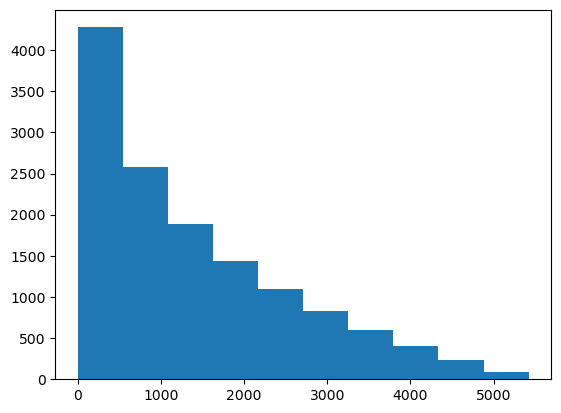

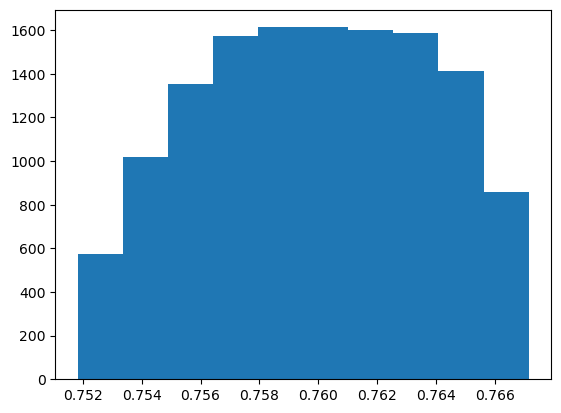

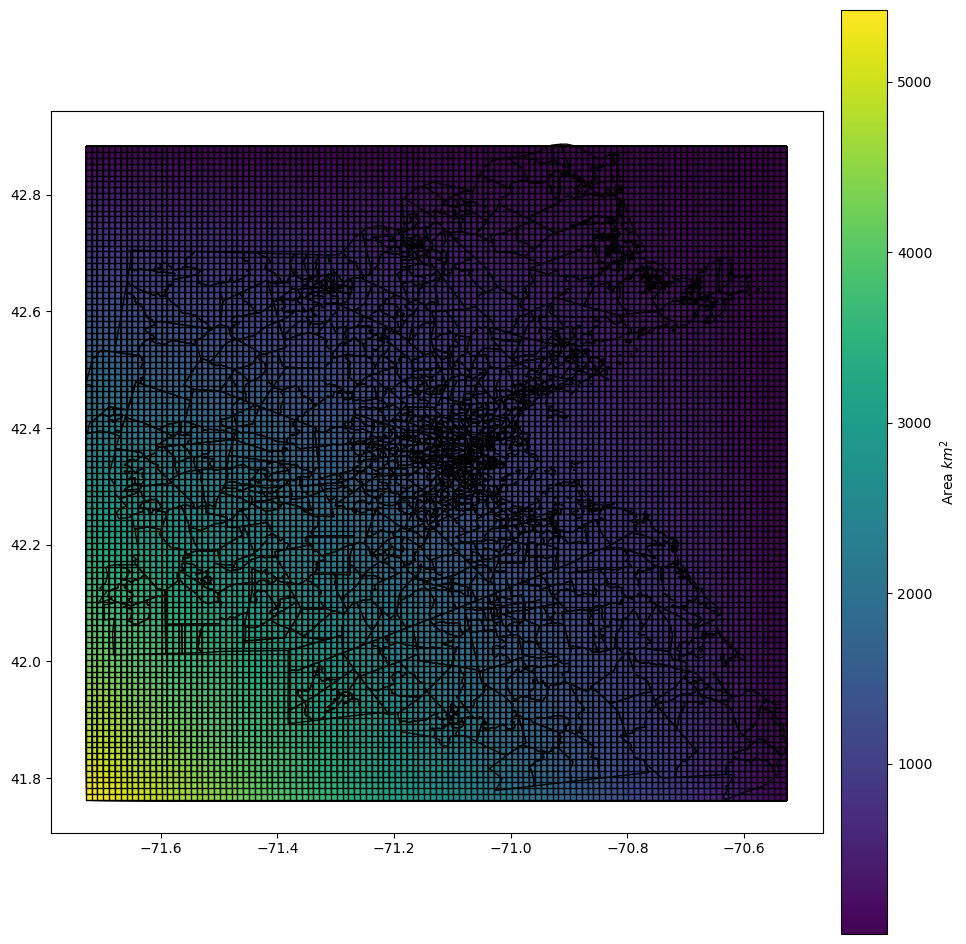

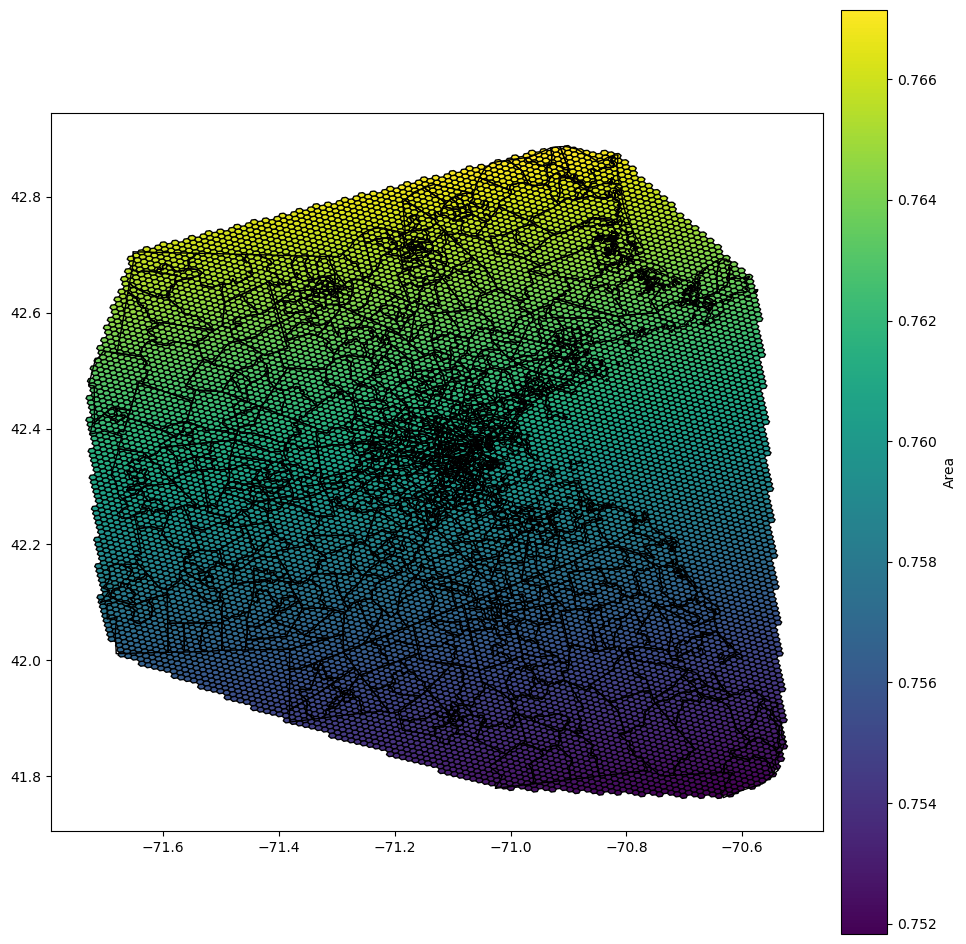

In [345]:
def xy(lat,lon,lat0,lon0):
    '''
    Description:
    Projects in the tangent space of the earth in (lat0,lon0) 
    Return: 
    The projected coordinates of the lat,lon  '''
    PI = np.pi
    c_lat= 0.6*100000*(1.85533-0.006222*np.sin(lat0*PI/180))
    c_lon= c_lat*np.cos(lat0*PI/180)
    
    x = c_lon*(lon-lon0)
    y = c_lat*(lat-lat0)
    if isinstance(x,np.ndarray):
        pass
    else:        
        x = x.to_numpy()
    if isinstance(y,np.ndarray):
        pass
    else:
        y = y.to_numpy()

    return x,y

def calculate_area(geometry):
    x,y = geometry.centroid.xy
    lat0 = x[0]
    lon0 = y[0]
    # Extract the coordinates from the Polygon's exterior
    latlon = np.array([[p[0],p[1]] for p in geometry.exterior.coords]).T
    lat = latlon[0]
    lon = latlon[1]
    # Ensure the last coordinate is the same as the first to close the polygon
    print('lat: ',lat)
    print('lon: ',lon)    
    x,y = xy(lat,lon,lat0,lon0)
    area = np.sqrt((x[1] - x[0])**2 + (y[1] - y[0])**2)*np.sqrt((x[2] - x[1])**2 + (y[2] - y[1])**2)/1000000
    return area
print(gdf_hexagons)
gdf_hexagons.crs = 'epsg:4326'
gdf_hexagons['area'] = gdf_hexagons.to_crs({'proj':'cea'}).area / 10**6
grid['area'] = grid['geometry'].apply(calculate_area)

plt.hist(grid['area'])
plt.show()

#gdf_hexagons['area'] = gdf_hexagons.geometry.apply(calculate_area)
#gdf_hexagons['area'] = gdf_hexagons.geometry.apply(lambda x: x.area)
plt.hist(gdf_hexagons['area'])
fig,ax = plt.subplots(1,1,figsize=(12,12))
grid.plot(ax=ax,column='area',cmap='viridis', edgecolor='black')#color='white',
BO_polygon.plot(ax=ax, facecolor = 'none', edgecolor='black')
cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='vertical', pad=0.02)
cbar.set_label('Area $km^2$')
ax.set_aspect('equal')
fig,ax = plt.subplots(1,1,figsize=(12,12))
cb = gdf_hexagons.plot(ax=ax,column='area',cmap='viridis', edgecolor='black')#color='white',
BO_polygon.plot(ax=ax, facecolor = 'none', edgecolor='black')
ax.set_aspect('equal')
cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='vertical', pad=0.02)
cbar.set_label('Area')


         NAME  CENSUSAREA   LSAD                GEO_ID COUNTY STATE   TRACT  \
0     4251.03       0.341  Tract  1400000US06001425103    001    06  425103   
1     4251.04       0.415  Tract  1400000US06001425104    001    06  425104   
2        4261       1.155  Tract  1400000US06001426100    001    06  426100   
3        4271       0.396  Tract  1400000US06001427100    001    06  427100   
4        4278       0.321  Tract  1400000US06001427800    001    06  427800   
...       ...         ...    ...                   ...    ...   ...     ...   
1580  4403.04       0.378  Tract  1400000US06001440304    001    06  440304   
1581     3892       0.096  Tract  1400000US06013389200    013    06  389200   
1582  4506.04       0.816  Tract  1400000US06001450604    001    06  450604   
1583   123.02       0.036  Tract  1400000US06075012302    075    06  012302   
1584  5091.07       0.169  Tract  1400000US06085509107    085    06  509107   

          tractID  tractID_ne  \
0     06001425103 

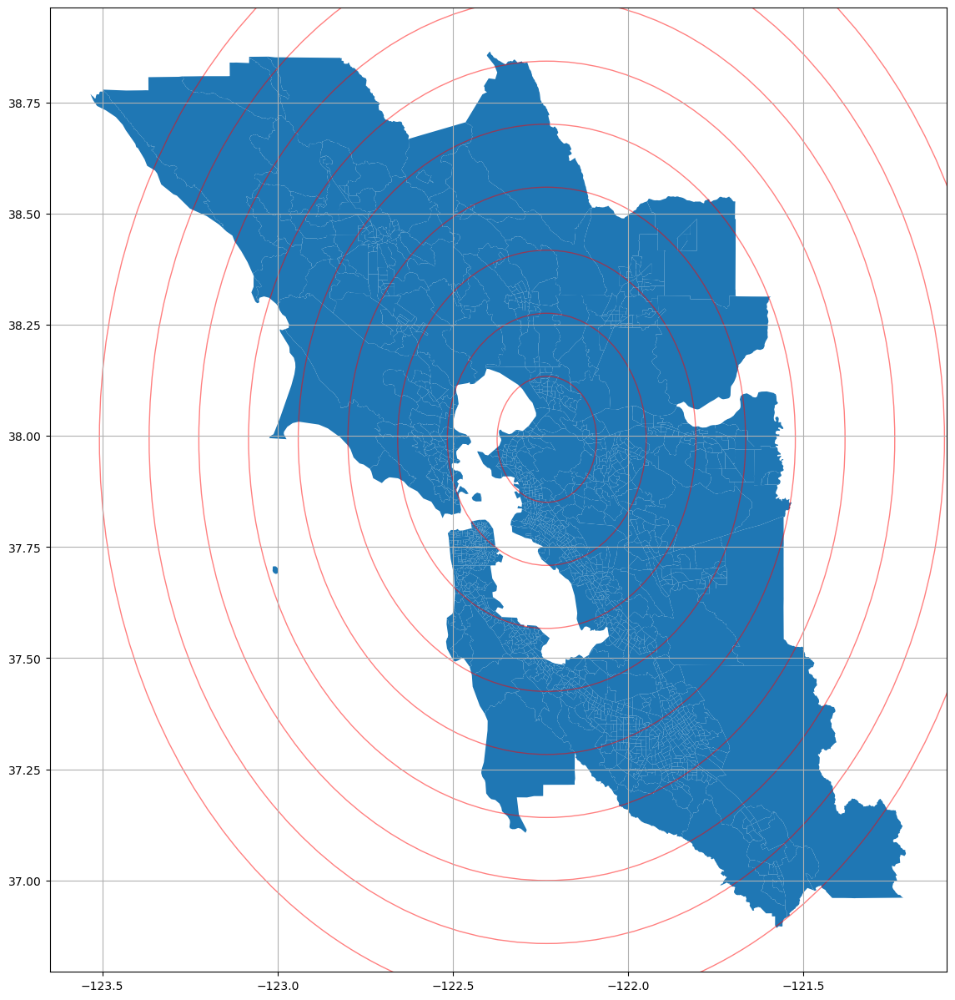

In [ ]:
#nodes,edges = ox.utils_graph.graph_to_gdfs(SF_polygon, nodes=True, edges=True, node_geometry=True, fill_edge_geometry=True)
fig,ax = plt.subplots(1,1,figsize=(20,15))
gdf.plot(ax = ax)
precision = 10
new_radius = radius + 0.5
radiuses = np.linspace(0,new_radius,precision)

for r in radiuses:
    gdf['intersection_{}'.format(r)] = gdf.geometry.apply(lambda x: x.intersection(x.buffer(r)))
    circle = plt.Circle(np.array([centroid.x,centroid.y]), r, color='red',fill=False ,alpha = 0.5)
#    cr = shp.buffer(centroid, r)
    ax.add_artist(circle)
    ax.set_in_layout(True)
    ax.grid(True)
    ax.get_shared_x_axes()
    ax.get_shared_y_axes()
print(gdf)

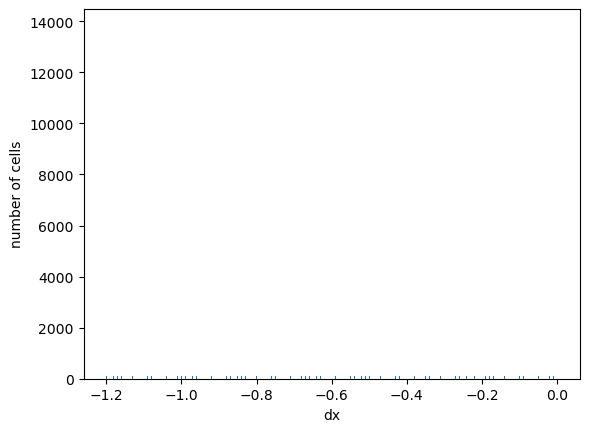

n:  [ 1356  1356  1356  1356  1356  1356  1356  1356  1356 15142]
bins:  [-1.2  -1.08 -0.96 -0.84 -0.72 -0.6  -0.48 -0.36 -0.24 -0.12  0.  ]


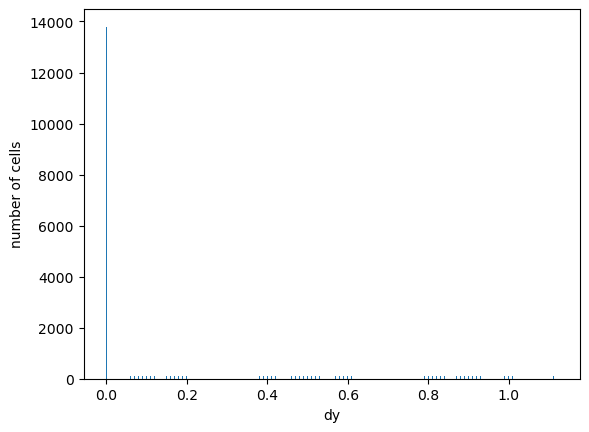

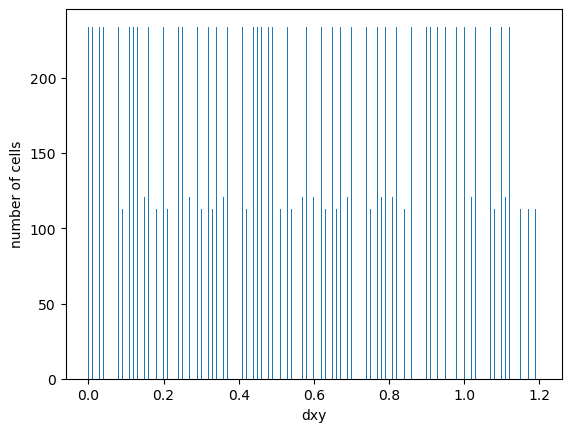

In [314]:
list_dx = []
list_dy = []
list_dxy = []
for grid_cell in grid_points.geometry:
    xy= grid_cell.exterior.coords
    for i in range(len(xy[0])):
        dx = xy[i+1][0] -xy[i][0]
        dy = xy[i+1][1] -xy[i][1]
        list_dx.append(dx)
        list_dy.append(dy)
        list_dxy.append(np.sqrt(dx**2 + dy**2))
plt.hist(list_dx,bins = 1000)
plt.xlabel('dx')
plt.ylabel('number of cells')
plt.show()
n,bins = np.histogram(list_dx)
print('n: ',n)
print('bins: ',bins)
plt.hist(list_dy,bins = 1000)
plt.xlabel('dy')
plt.ylabel('number of cells')
plt.show()
plt.hist(list_dxy,bins = 1000)
plt.xlabel('dxy')
plt.ylabel('number of cells')
plt.show()

In [300]:
from collections import defaultdict
#PARAMETERS
grid_size = 0.01
crs = gdf_polygons.crs
number_of_rings = 10
# GRID
centroid = gdf_polygons.geometry.unary_union.centroid
bounding_box = gdf_polygons.geometry.unary_union.bounds
bbox = shp.geometry.box(*bounding_box)
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox], crs=crs)
x = np.arange(bounding_box[0], bounding_box[2], grid_size)
y = np.arange(bounding_box[1], bounding_box[3], grid_size)
grid_points = gpd.GeoDataFrame(geometry=[shp.geometry.box(xi, yi,maxx = max(x),maxy = max(y)) for xi in x for yi in y], crs=crs)

print('grid_points: ',grid_points.crs)
ij = [[i,j] for i in range(len(x)) for j in range(len(y))]
grid_points['i'] = np.array(ij)[:,0]
grid_points['j'] = np.array(ij)[:,1]
# Clip the grid to the bounding box
grid = gpd.overlay(grid_points, bbox_gdf, how='intersection')
print(grid.to_crs(grid_points.crs).area)
# RINGS
rings = defaultdict(list)
gdf_original_crs = gpd.GeoDataFrame(geometry=[centroid], crs=crs)
radius = max([abs(bounding_box[0] -bounding_box[2])/2,abs(bounding_box[1] - bounding_box[3])/2]) 
radiuses = np.linspace(0,radius,number_of_rings)
for i,r in enumerate(radiuses):
    if i == 0:
        intersection_ = gdf_original_crs.buffer(r)
        rings[i] = intersection_
    else:
        intersection_ = gdf_original_crs.buffer(r).intersection(gdf_original_crs.buffer(radiuses[i-1]))
        complement = gdf_original_crs.buffer(r).difference(intersection_)
        rings[i] = complement
rings = gpd.GeoDataFrame(geometry=pd.concat(list(rings.values()), ignore_index=True),crs=crs)


/tmp/ipykernel_4631/701095383.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  print('grid_points: ',grid_points.area)


grid_points:  0        1.344
1        1.332
2        1.320
3        1.308
4        1.296
         ...  
13668    0.000
13669    0.000
13670    0.000
13671    0.000
13672    0.000
Length: 13673, dtype: float64


/tmp/ipykernel_4631/701095383.py:20: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  print(grid.to_crs(grid_points.crs).area)
/tmp/ipykernel_4631/701095383.py:31: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersection_ = gdf_original_crs.buffer(r).intersection(gdf_original_crs.buffer(radiuses[i-1]))
/tmp/ipykernel_4631/701095383.py:32: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  complement = gdf_original_crs.buffer(r).difference(intersection_)


0        1.3440
1        1.3320
2        1.3200
3        1.3080
4        1.2960
          ...  
13435    0.0005
13436    0.0004
13437    0.0003
13438    0.0002
13439    0.0001
Length: 13440, dtype: float64


AttributeError: 'Graph' object has no attribute 'draw'

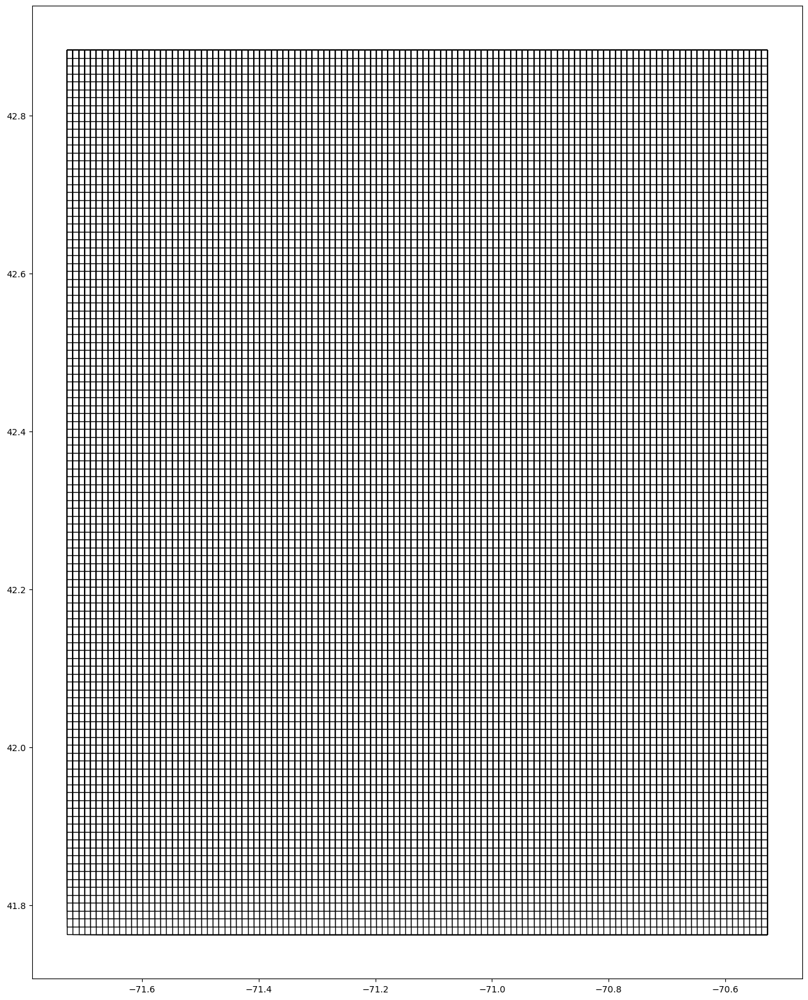

In [169]:
from scipy.spatial import distance_matrix
fig,ax = plt.subplots(1,1,figsize=(20,20))
grid.plot(ax=ax, color='white', edgecolor='black')
labels = [f"({row['i']},{row['j']})" for _, row in grid.iterrows()]
#or idx, row in grid.iterrows():
sindex = grid.sindex

# Function to check if two polygons are neighbors
def are_neighbors(poly1, poly2):
    return poly1.geometry.touches(poly2.geometry)
G = nx.Graph()

# Add nodes to the graph, each node representing a polygon in the grid
for idx, row in grid.iterrows():
    G.add_node(idx, position=(row['centroid'].x, row['centroid'].y), indices=(row['i'], row['j']))
# Add edges connecting neighboring polygons
for idx1, data1 in G.nodes(data=True):
    pos1 = data1['position']
    i1, j1 = data1['indices']
    possible_matches_idx = list(sindex.intersection((pos1[0], pos1[1], pos1[0], pos1[1])))
    
    for idx2 in possible_matches_idx:
        if idx1 != idx2:
            i2, j2 = G.nodes[idx2]['indices']
            if are_neighbors(grid.loc[idx1], grid.loc[idx2]):
                G.add_edge(idx1, idx2)    
#    t0 = time.time()
#    for b in range(len(grid)):
#        if b>a:
#            if ((grid.iloc[b]['i'] - grid.iloc[a]['i']) == 1 and (grid.iloc[b]['j'] - grid.iloc[a]['j']) == 0) or ((grid.iloc[b]['i'] - grid.iloc[a]['i']) == 0 and (grid.iloc[b]['j'] - grid.iloc[a]['j']) == 1) :
#                G.add_edge((grid.iloc[a]['i'],grid.iloc[a]['j']), (grid.iloc[b]['i'],grid.iloc[b]['j']))
#    t1 = time.time()
#    print('time elapsed constructing edges: ',t1-t0)

G.draw(ax = ax)

#    ax.scatter(row.geometry.centroid.x, row.geometry.centroid.y, color='black')
#    ax.text(row.geometry.centroid.x, row.geometry.centroid.y, f"({row['i']},{row['j']})",color='red')

In [330]:
x = np.arange(bounding_box[0], bounding_box[2], grid_size)
y = np.arange(bounding_box[1], bounding_box[3], grid_size)
ij = [[row['i'],row['j']] for _, row in grid.iterrows()]
print(grid)
G = nx.grid_2d_graph(len(x),len(y))
for idx, row in grid.iterrows():
    G[idx]['postition'] = row['centroid'].x, row['centroid'].y
for edge in G.edges():
    G[edge[0]][edge[1]]['dx'] = G[edge[1]]['postition'][0] - G[edge[0]]['postition'][0]
    G[edge[0]][edge[1]]['dy'] = G[edge[1]]['postition'][1] - G[edge[0]]['postition'][1]
#pos = nx.spring_layout(G)
# Draw the graph with lattice layout
nx.draw(G, pos, with_labels=False, font_weight='bold', node_color='lightblue', node_size=10, edge_color='gray', linewidths=2, font_size=10, font_color='darkblue')

         i    j                                           geometry  \
0        0    0  POLYGON ((-70.52838 42.88282, -70.52838 41.762...   
1        0    1  POLYGON ((-70.52838 42.88282, -70.52838 41.772...   
2        0    2  POLYGON ((-70.52838 42.88282, -70.52838 41.782...   
3        0    3  POLYGON ((-70.52838 42.88282, -70.52838 41.792...   
4        0    4  POLYGON ((-70.52838 42.88282, -70.52838 41.802...   
...    ...  ...                                                ...   
13435  119  107  POLYGON ((-70.53838 42.83282, -70.53838 42.882...   
13436  119  108  POLYGON ((-70.53838 42.84282, -70.53838 42.882...   
13437  119  109  POLYGON ((-70.53838 42.85282, -70.53838 42.882...   
13438  119  110  POLYGON ((-70.53838 42.86282, -70.53838 42.882...   
13439  119  111  POLYGON ((-70.53838 42.87282, -70.53838 42.882...   

              area  
0      5421.274800  
1      5372.870561  
2      5324.466321  
3      5276.062082  
4      5227.657843  
...            ...  
13435     2.

KeyError: 'centroid'

In [327]:
for edge in G.edges():
    print(G.edges[edge][])
    break

{}


In [181]:
import dis
dis.dis(nx.grid_2d_graph)
dict_stats = ox.basic_stats(SF_polygon)
dict_stats

  1           0 RESUME                   0

  3           2 LOAD_GLOBAL              1 (NULL + argmap__nodes_or_number_20)
             14 LOAD_FAST                0 (m)
             16 PRECALL                  1
             20 CALL                     1
             30 STORE_FAST               0 (m)

  4          32 LOAD_GLOBAL              1 (NULL + argmap__nodes_or_number_20)
             44 LOAD_FAST                1 (n)
             46 PRECALL                  1
             50 CALL                     1
             60 STORE_FAST               1 (n)

  5          62 LOAD_GLOBAL              3 (NULL + argmap_grid_2d_graph_19)
             74 LOAD_FAST                0 (m)
             76 LOAD_FAST                1 (n)
             78 LOAD_FAST                2 (periodic)
             80 LOAD_FAST                3 (create_using)
             82 PRECALL                  4
             86 CALL                     4
             96 RETURN_VALUE


{'n': 34093,
 'm': 71256,
 'k_avg': 4.180095620801924,
 'edge_length_total': 32037513.037999872,
 'edge_length_avg': 449.6114437801711,
 'streets_per_node_avg': 3.319537735018919,
 'streets_per_node_counts': {0: 0,
  1: 1207,
  2: 359,
  3: 20310,
  4: 10875,
  5: 1242,
  6: 92,
  7: 8},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.03540316193940105,
  2: 0.010530020825389376,
  3: 0.5957234622943126,
  4: 0.3189804358666002,
  5: 0.03642976564104068,
  6: 0.002698501158595606,
  7: 0.00023465227466048748},
 'intersection_count': 32886,
 'street_length_total': 20816865.735,
 'street_segment_count': 54266,
 'street_length_avg': 383.6078895625253,
 'circuity_avg': 1.0951710721512888,
 'self_loop_proportion': 0.0011793756680057495}

In [ ]:
#SF = ox.graph_from_place("San Francisco, California, USA", network_type="drive")
SF_polygon = gpd.read_file(SF_polygon_file)
cg = 0
for g in SF_polygon.geometry:
    if cg%100 == 0:
        print('main cycle: ',cg)
    cg1 = 0
    for g1 in SF_polygon.geometry:
        if cg<cg1:
            g_int = g.intersection(g1)
            if type(g_int) == Polygon and g_int.is_empty == False:
                print('g_int: ',g_int)
                print('intersection Area: {0},{1} '.format(cg,cg1),g_int.area())
                fig, ax = ox.plot_graph(g_int,xlabel = 'longitude',ylabel = 'latitude',title = 'intersection',show = True)
                fig, ax = ox.plot_graph(g,xlabel = 'longitude',ylabel = 'latitude',title = '{}'.format(cg),show = True)
                fig, ax = ox.plot_graph(g1,xlabel = 'longitude',ylabel = 'latitude',title = '{}'.format(cg1),show = True)
                plt.show()
        cg1 += 1
        if cg1%1000 == 0:
            print('cg1: ',cg1)

    cg += 1
#fig, ax = ox.plot_graph(SF)
#SF_polygon.plot(ax=ax, facecolor='none', edgecolor='red')
print(len(SF_polygon))

main cycle:  0
cg1:  1000
main cycle:  1
cg1:  1000
main cycle:  2
cg1:  1000
main cycle:  3
cg1:  1000
main cycle:  4
cg1:  1000
main cycle:  5
cg1:  1000
main cycle:  6
cg1:  1000
main cycle:  7
cg1:  1000
main cycle:  8
cg1:  1000
main cycle:  9
cg1:  1000
main cycle:  10
cg1:  1000
main cycle:  11
cg1:  1000
main cycle:  12
cg1:  1000
main cycle:  13
cg1:  1000
main cycle:  14
cg1:  1000
main cycle:  15
cg1:  1000
main cycle:  16
cg1:  1000
main cycle:  17
cg1:  1000
main cycle:  18
cg1:  1000
main cycle:  19
cg1:  1000
main cycle:  20
cg1:  1000
main cycle:  21
cg1:  1000
main cycle:  22
cg1:  1000
main cycle:  23
cg1:  1000
main cycle:  24
cg1:  1000
main cycle:  25
cg1:  1000
main cycle:  26
cg1:  1000
main cycle:  27
cg1:  1000
main cycle:  28
cg1:  1000
main cycle:  29
cg1:  1000
main cycle:  30
cg1:  1000
main cycle:  31
cg1:  1000
main cycle:  32
cg1:  1000
main cycle:  33
cg1:  1000
main cycle:  34
cg1:  1000
main cycle:  35
cg1:  1000
main cycle:  36
cg1:  1000
main cycle:

In [ ]:
def plot_pointinpolygon(gdf,containing_polygon,SF,node):
    fig,ax = plt.subplots(1,1,figsize=(10,10))
    gdf.loc[gdf[containing_polygon].index].plot(ax = ax,figsize=(10,10),color = 'red',edgecolor = 'black',alpha = 0.5)
    ax.scatter(SF.nodes[node]['x'],SF.nodes[node]['y'])
    ax.set_xlabel('longitude')
    ax.set_ylabel('latitude')
    ax.set_title('Node in polygon: {}'.format(gdf[containing_polygon].index))    
    plt.show()
    print('idx_containing_polygon: ',idx_containing_polygon)

## CARTOGRAPHY and SHAPEFILE REQUIRED
#SF = ox.graph_from_place("San Francisco, California, USA", network_type="drive")
#gdf = gpd.read_file(SF_polygon_file)
## FUNCION
from collections import defaultdict
polygon2origindest = defaultdict(list)
possiblekeys = ['tractID','tractid','TRACTID','tract_id','tract_ID','TRACT_ID','TRACTCE']
for node in SF.nodes():
    containing_polygon = gdf.geometry.apply(lambda x: x.contains(Point(SF.nodes[node]['x'],SF.nodes[node]['y'])))
    idx_containing_polygon = gdf[containing_polygon].index
    found_key = False
    for key in possiblekeys:
        if key in gdf.columns:
            found_key = True
            break
    if found_key:
        tract_id = gdf.loc[idx_containing_polygon][key]
    else:
        raise KeyError('No key found in: ',gdf.columns)
    if len(tract_id)==1: 
        tract_id = tract_id.tolist()[1]
        polygon2origindest[tract_id].append(node)
    elif len(tract_id)>1:
        print('found polygon: ',idx_containing_polygon)
        print('tract_id: ',tract_id)
        print('type tract_id: ',type(tract_id))
        print('values dict: ',polygon2origindest[tract_id])
        print('dict: ',polygon2origindest)
        plot_pointinpolygon(gdf,containing_polygon,SF,node)

        raise ValueError('more than one tract id: THIS IS STRANGE')
    else:
        pass


found polygon:  Index([1038], dtype='int64')
tract_id:  6075061500
type tract_id:  <class 'pandas.core.series.Series'>


/tmp/ipykernel_270667/273856847.py:29: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('tract_id: ',int(tract_id))


TypeError: unhashable type: 'Series'

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

alphas = np.linspace(0,10,10)
taus = np.linspace(0,1,10)
t = np.linspace(0,1,100)
p_t_tau = (1/tau)*np.exp(-(t/tau))
fig,ax = plt.subplots(1,1,figsize=(10,10))
for alpha in alphas:
    for tau in taus:
        p_tau = 1/tau**alpha
        Z_tau_alpha = np.sum(p_t_tau*p_tau)
        p_t_and_tau = p_t_tau*p_tau/Z_tau_alpha
        ax.plot(t,p_t_and_tau)
ax.set_xlabel('t')
ax.set_ylabel('$p(t,\tau)$')    
ax.legend(alphas)
plt.show()

/tmp/ipykernel_270667/2042909579.py:7: RuntimeWarning: divide by zero encountered in divide
  p_t_tau = (1/tau)*np.exp(-(t/tau))


ValueError: operands could not be broadcast together with shapes (100,) (10,) 

In [ ]:
import rasterio
from rasterio.plot import show
from rasterio.windows import Window
from rasterio.mask import mask
import h3
import shapely.geometry as sg
import geopandas as gpd
import numpy as np
# Function to aggregate population data for each hexagon

def aggregate_population(hexagon, hexagon_transform, clipped_data):
    # Convert hexagon to pixel coordinates
    hexagon_coords = np.array(hexagon.exterior.xy).T
    hexagon_pixel_coords = np.array(rasterio.transform.rowcol(hexagon_transform, hexagon_coords[:, 0], hexagon_coords[:, 1]))
    # Ensure coordinates are within valid bounds
    valid_coords = (
        (0 <= np.array(hexagon_pixel_coords[0])) & (np.array(hexagon_pixel_coords[0]) < clipped_data.shape[1]) &
        (0 <= np.array(hexagon_pixel_coords[1])) & (np.array(hexagon_pixel_coords[1]) < clipped_data.shape[2])
    )

    # Filter valid coordinates
    valid_pixel_coords = hexagon_pixel_coords[:, valid_coords]

    # Extract values from clipped data
    values = clipped_data[0, valid_pixel_coords[0], valid_pixel_coords[1]]

    # Aggregate population data (example: sum)
    population_sum = np.sum(values)

    return population_sum

# Replace 'path/to/your/file.tif' with the actual path to your GeoTIFF file
file_path = '/home/aamad/Desktop/phd/berkeley/data/usa_ppp_2020_UNadj_constrained.tif'
bay_area_gdf = gpd.read_file('/home/aamad/Desktop/phd/berkeley/data/BOS/BOS.shp')

#roi_window = Window(col_off=1000, row_off=5000, width=1000, height=1000)

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read raster data
    clipped_data, clipped_transform = mask(dataset, bay_area_gdf.geometry, crop=True)
clipped_data = np.array(clipped_data)
condition = clipped_data<0
clipped_data[condition] = 0

# Define hexagon resolution (adjust based on your requirements)
resolution = 8
bay_area_geometry = bay_area_gdf.unary_union

# Convert MultiPolygon to a single Polygon
bay_area_polygon = bay_area_geometry.convex_hull

# Convert Polygon to a GeoJSON-like dictionary
bay_area_geojson = sg.mapping(bay_area_polygon)
# Get hexagons within the bay area
hexagons = h3.polyfill(bay_area_geojson, resolution, geo_json_conformant=True)

# Convert hexagons to Shapely geometries
hexagon_geometries = [sg.Polygon(h3.h3_to_geo_boundary(h, geo_json=True)) for h in hexagons]


# Aggregate population data for each hexagon
population_data_hexagons = [aggregate_population(hexagon, clipped_transform, clipped_data) for hexagon in hexagon_geometries]



In [ ]:
sum(population_data_hexagons)

261954.64948958345

[0.00562074 0.00564444 0.00560091 ... 0.00565651 0.00565549 0.00566499]


/tmp/ipykernel_4631/2821436777.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  areas = gdf.area


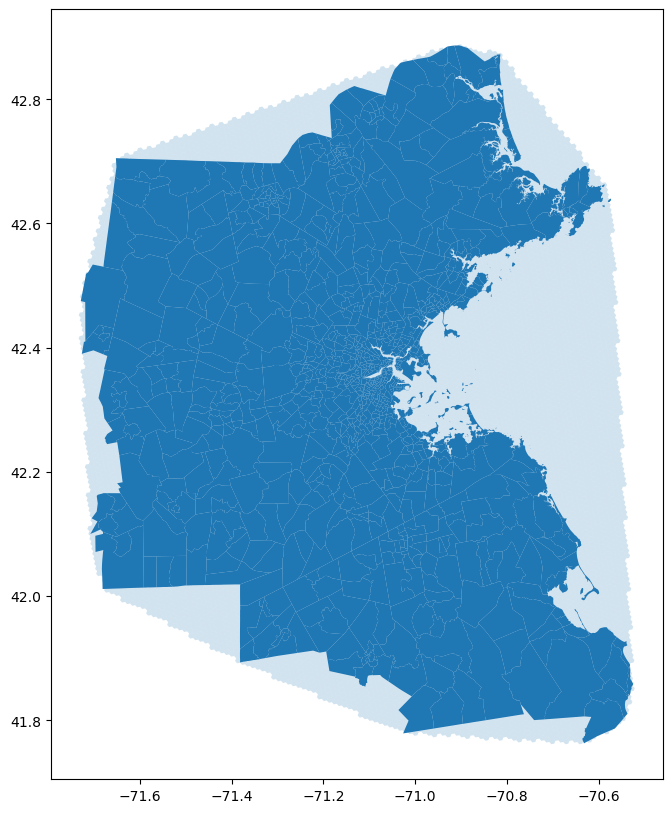

In [ ]:
fig,ax = plt.subplots(1,1,figsize=(10,10))
gpd.GeoDataFrame(geometry = hexagon_geometries,crs ="EPSG:4326").plot(ax = ax,alpha = 0.2)
gdf = gpd.GeoDataFrame(geometry = hexagon_geometries,crs ="EPSG:4326")
bay_area_gdf.plot(ax = ax)
#gdf = gdf.to_crs(epsg=4326,inplace=True)
areas = gdf.area
side_length_km = (np.array(areas) * 2 / (3 * (3**0.5)))**0.5
print(side_length_km)

In [220]:
edge_length_at_equator = h3.edge_length(8, unit="km")
def hexagon_area(side_length):
    return (3 *np.sqrt(3) / 2) * (side_length ** 2)
print(hexagon_area(edge_length_at_equator))


0.5529957007229654


(-122.20807493456508, 37.25016875691537)
(-122.21397227028571, 37.25134284921546)
(-122.2154056765059, 37.25606141910635)
(-122.21094140866563, 37.259606083548526)
(-122.20504352796014, 37.25843205829162)
(-122.20361046012734, 37.253713301559266)
(-122.20807493456508, 37.25016875691537)


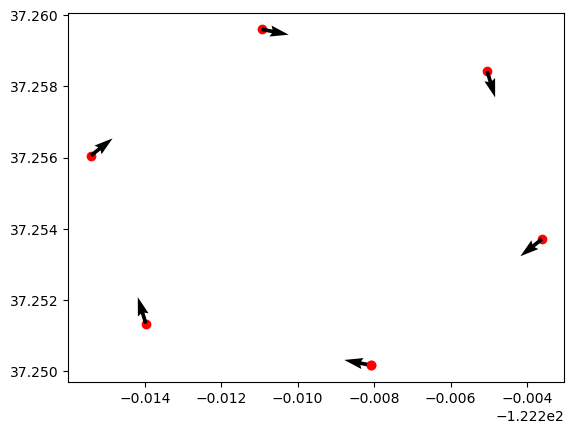

In [ ]:
boundary = gdf_hexagons.loc[0]['geometry'].convex_hull.boundary.coords.xy
bounds_pointsdim = list(zip(boundary[0],boundary[1]))
for i,point in enumerate(bounds_pointsdim):
    print(point)
    plt.scatter(point[0],point[1],color = 'red')
    if i > 0:
        plt.quiver(bounds_pointsdim[i-1][0],bounds_pointsdim[i-1][1],bounds_pointsdim[i][0]-bounds_pointsdim[i-1][0],bounds_pointsdim[i][1]-bounds_pointsdim[i-1][1])

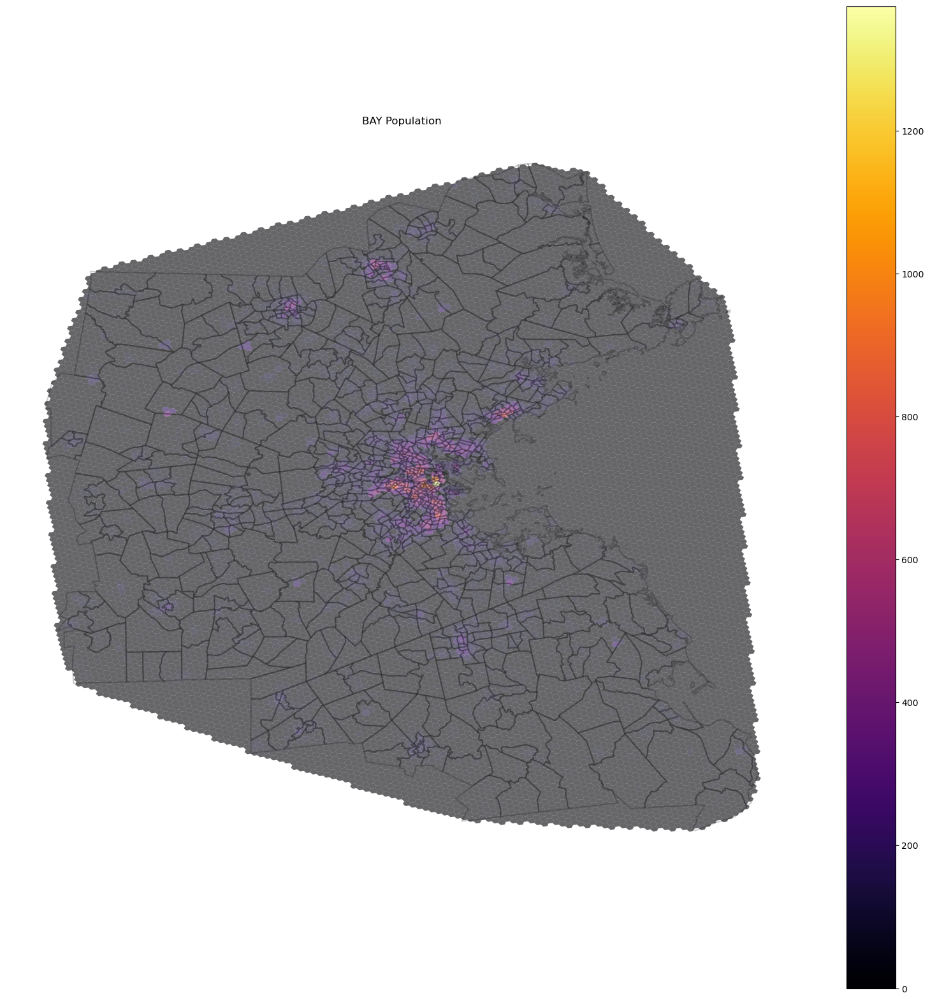

In [ ]:
fig,ax = plt.subplots(1,1,figsize=(20,20))
gdf_hexagons = gpd.GeoDataFrame(geometry=hexagon_geometries, data=population_data_hexagons, columns=['population'])
gdf_hexagons.reset_index(inplace=True)
bay_area_gdf.boundary.plot(ax = ax,alpha = 0.2,color = 'black')
gdf_hexagons.loc[:,('population','geometry')].plot(ax=ax, column='population',legend=True,alpha = 0.6,cmap = 'inferno')
ax.axis('off')
ax.set_title('BAY Population')
plt.show()


In [ ]:
def OD2matrix(df_od):
    '''
        Create: 
            1) 02mapidxorigin {0:origin1,1:origin2,...}
            2) 02mapidxdestination {0:destination1,1:destination2,...}
            3) mapidx2origin {origin1:0,origin2:1,...}
            4) mapidx2destination {destination1:0,destination2:1,...}
            origin_i,destination_i are the nominative of self.gdf_polygons
    '''
    origins = np.unique(df_od['origin'].to_numpy())
    destinations = np.unique(df_od['destination'].to_numpy())
    mapOD = df_od.groupby('origin')['destination'].unique().apply(lambda x: x[0]).to_dict()
    zero2mapidxorigin = {i:idx for idx,i in enumerate(origins)}
    zero2mapidxdestination = {i:idx for idx,i in enumerate(destinations)}
    mapidx2origin = {idx:i for idx,i in enumerate(origins)}
    mapidx2destination = {idx:i for idx,i in enumerate(destinations)}
    dimensionality_matrix = (len(origins),len(destinations))
    matrix_OD = np.zeros(dimensionality_matrix)
    print('OD: ',np.shape(matrix_OD))
    trips_OD = df_od.groupby(['origin']).count()['destination'].to_numpy(dtype= int)
    print('Origin destination couples: ',np.shape(trips_OD))
    for idx in range(len(origins)):
            matrix_OD[zero2mapidxorigin[origins[idx]],zero2mapidxdestination[mapOD[origins[idx]]]] = trips_OD[idx]
    print('matrix OD:\n',matrix_OD)
    matrix_out = np.sum(matrix_OD,axis=1)
    print('matrix_out:\n',matrix_out)
    matrix_in = np.sum(matrix_OD,axis=0)
    print('matrix_in:\n',matrix_in)
    return matrix_OD,matrix_out,matrix_in,zero2mapidxorigin,zero2mapidxdestination,mapidx2origin,mapidx2destination

/tmp/ipykernel_4631/2262829265.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_polygons['centroid'] = gdf_polygons.centroid


OD:  (20152, 20149)
Origin destination couples:  (20152,)
matrix OD:
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
matrix_out:
 [11. 19. 15. ...  6. 42. 11.]
matrix_in:
 [ 38.  39.  20. ... 400.  13.  44.]


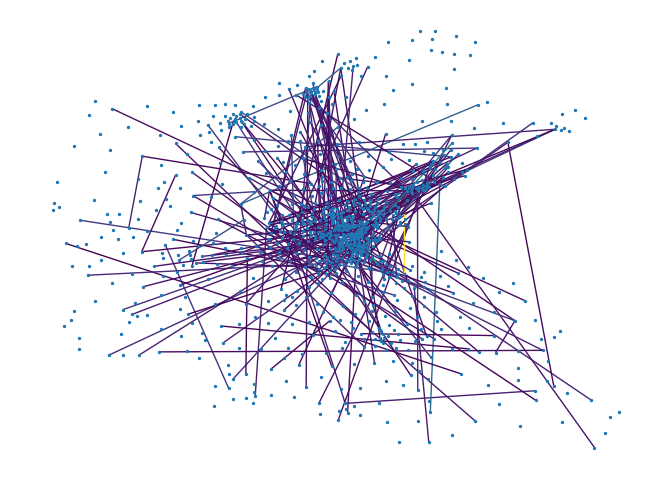

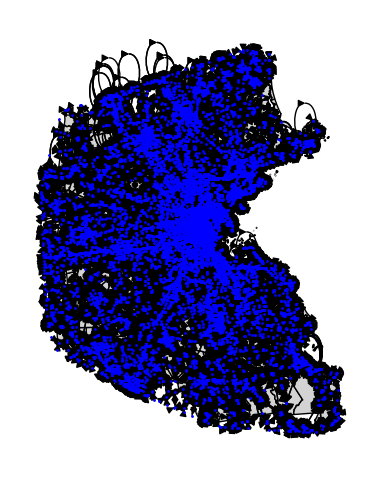

In [ ]:
import pandas as pd
import osmnx as ox
import matplotlib.cm as cm


OD_ti_BO = pd.read_csv('/home/aamad/Desktop/phd/berkeley/data/carto/BOS/od_demand_7to8_R_1.csv')
gdf_polygons = gpd.read_file('/home/aamad/Desktop/phd/berkeley/data/BOS/BOS.shp')
gdf_polygons['centroid'] = gdf_polygons.centroid

fluxes_matrix,matrix_out,matrix_in,zero2mapidxorigin,zero2mapidxdestination,mapidx2origin,mapidx2destination = OD2matrix(OD_ti_BO)

G_centroid = nx.Graph()
for index, row in gdf_polygons.iterrows():
    G_centroid.add_node(index, pos=row['centroid'].coords[0])
for i in range(len(fluxes_matrix)):
    for j in range(len(fluxes_matrix[0])):
        if i != j and fluxes_matrix[i][j] != 0:
            G_centroid.add_edge(i, j, flux=fluxes_matrix[i][j])

node_positions = {node: G_centroid.nodes[node]['pos'] for node in G_centroid.nodes() if 'pos' in G_centroid.nodes[node].keys()}
G_centroid.remove_nodes_from([node for node in G_centroid.nodes() if 'pos' not in G_centroid.nodes[node].keys()])
flux_values = nx.get_edge_attributes(G_centroid, 'flux').values()
flux_min, flux_max = min(flux_values), max(flux_values)

# Draw edges with colormap based on flux values
nx.draw(G_centroid, node_positions, with_labels=False, font_weight='bold', node_size=2, edge_color=list(flux_values), edge_cmap=plt.cm.viridis, edge_vmin=flux_min, edge_vmax=flux_max)

#plt.colorbar(cmap=cm.jet,vmin = flux_min, vmax = flux_max) 
# Example: Creating a random graph (replace with your graph creation logic)
G = ox.load_graphml(filepath='/home/aamad/Desktop/phd/berkeley/data/carto/BOS/BOS_new_tertiary_simplified.graphml')
# Get the coordinates from the pos dictionary
node_positions = {node: (G.nodes[node]['x'],G.nodes[node]['y']) for node in G.nodes()}
# Plot background GeoPandas map
ax = gdf_polygons.plot(figsize=(10, 6), color='lightgrey', edgecolor='k')

# Plot the graph on top of the background map
nx.draw(G, pos=node_positions, node_size=1, node_color='blue', with_labels=False, font_color='white', font_size=0.1, ax=ax)

# Show the plot
plt.show()


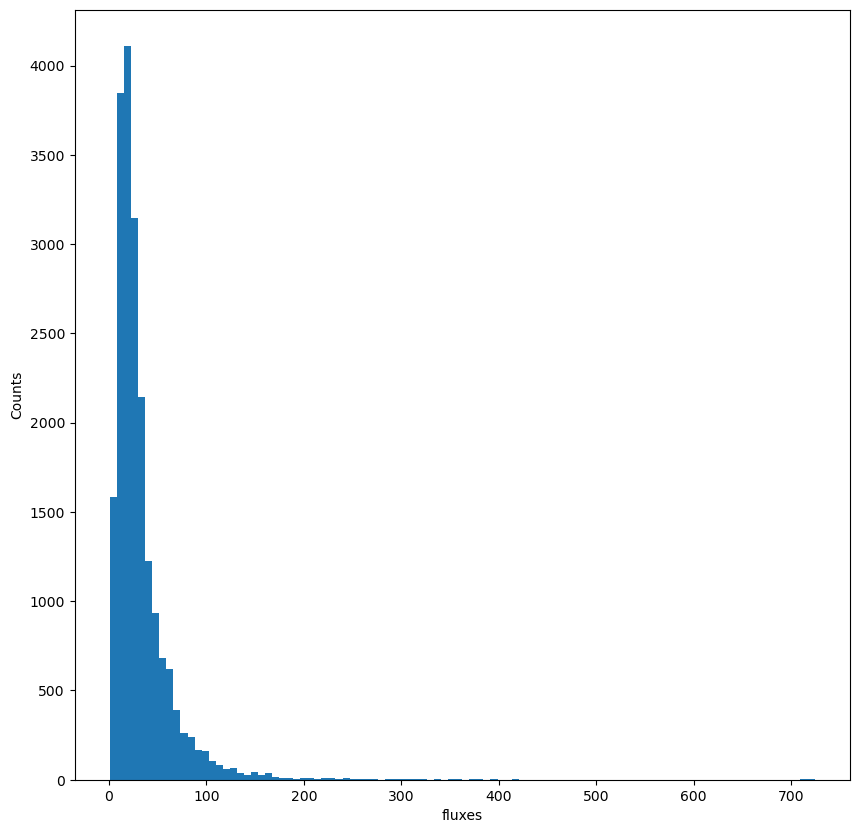

In [348]:
# FUCNTIONS FOR FITTING
def powerlaw(x, amp, index):
    return amp * (np.array(x)**index)

def exponential(x, amp, index):
    return amp * np.exp(-index*np.array(x))

def quadratic_loss_function(y_predict, y_measured):
    return np.sum((y_predict-y_measured)**2)

def objective_function_powerlaw(params,x,y_measured):
    return quadratic_loss_function(powerlaw(x, params[0], params[1]), y_measured)

def objective_function_exponential(params,x,y_measured):
    return quadratic_loss_function(exponential(x, params[0], params[1]), y_measured)

from scipy.optimize import curve_fit,minimize
from scipy import stats
from scipy.stats import powerlaw as pl

mask = fluxes_matrix.flatten()>0
flux_distr = fluxes_matrix.flatten()[mask]
fig,ax = plt.subplots(1,1,figsize=(10,10))
n,bins = np.histogram(flux_distr,bins = 100)
ax.scatter(bins[:-1],n)
ax.set_xlabel('fluxes')
ax.set_ylabel('Counts')
plt.show()

(20152, 20152)


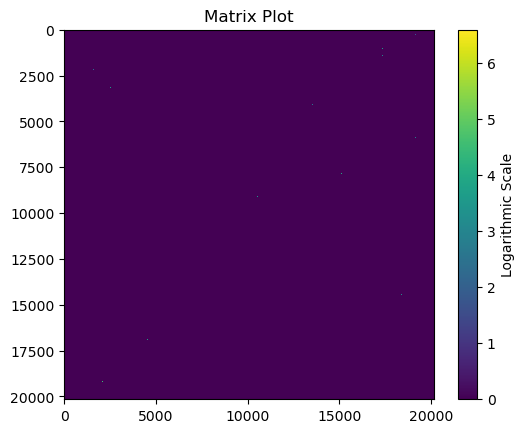

In [ ]:
print(np.shape(matrix_OD))
log = matrix_OD != 0
matrix_OD[log] = np.log(matrix_OD[log])
plt.imshow(matrix_OD, cmap='viridis', interpolation='nearest')

# Add colorbar for reference
plt.colorbar(label='Logarithmic Scale')
# Show the plot
plt.title('Matrix Plot')
plt.show()


# FITTING GRAVITATIONAL FIELD

In [ ]:
from scipy.optimize import curve_fit
def grav_field(mi,mj,d,k,d0):
    return mi*mj*(-k)*np.exp(-d/d0)


 mass shape:  ()
 tensor shape:  ()
 not yet flux vectors shape:  (974, 974, 2)
potential shape:  (974,)


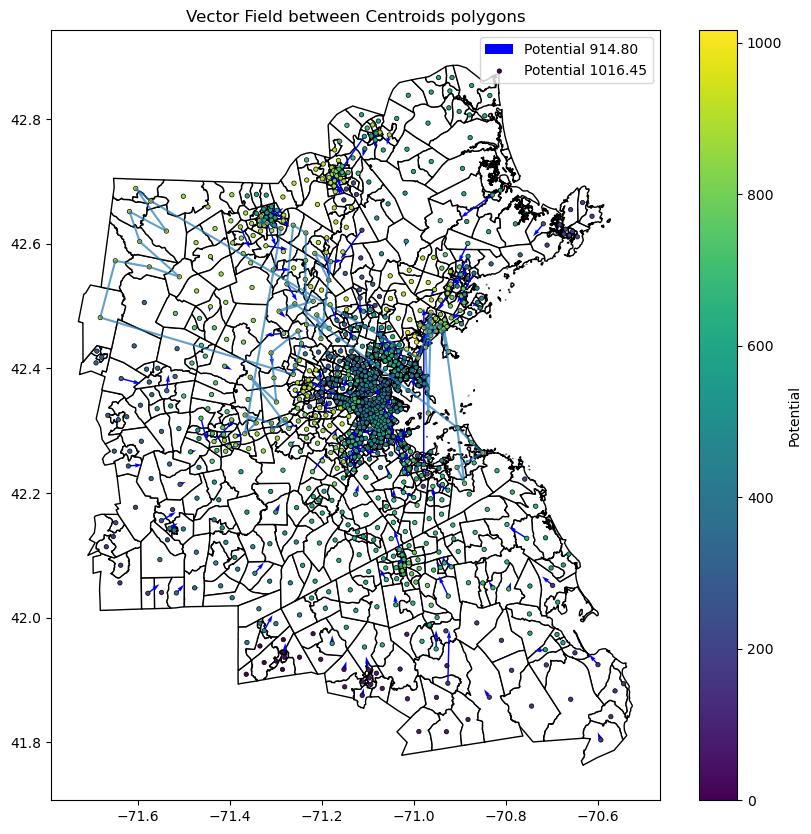

In [ ]:
import geopandas as gpd
from shapely.geometry import Point, LineString
import numpy as np
import matplotlib.pyplot as plt
def gravitational_field(fluxes_matrix,normalized_vectors,norm_vect):
    mass = np.sum(fluxes_matrix,axis=1)
    grav_vector_field = np.array([np.array([normalized_vectors[i][j]*mass[i]*mass[j]/norm_vect[i][j] for j in range(len(normalized_vectors[0]))]) for i in range(len(normalized_vectors))])    
    grav_vector_field = np.sum(grav_vector_field,axis=1)
    return grav_vector_field
# Sample list of points
fig, ax = plt.subplots(figsize=(10, 10))
point_coords = np.array([np.array(G_centroid.nodes[node]['pos']) for node in G_centroid.nodes() if 'pos' in G_centroid.nodes[node].keys()]) #SHAPE (ncenters,2)

points_3d = point_coords[:, np.newaxis, :]
#dx = point_coords.T[0] - point_coords[:,0]
#dy = point_coords.T[1] - point_coords[:,1]
vectors = point_coords - points_3d #SHAPE (ncenters,ncenters,2)`
norm_vect =  np.linalg.norm(vectors, axis=2)[:, :, np.newaxis] #SHAPE (ncenters,ncenters,1)
nv = np.array([np.array([norm_vect[i][j][0] if norm_vect[i][j][0] != 0 else 1 for j in range(len(norm_vect[i]))]) for i in range(len(norm_vect))]) #SHAPE (ncenters,ncenters)
normalized_vectors = [[vectors[i][j] / nv[i][j] for j in range(len(vectors[i]))] for i in range(len(vectors))] #SHAPE (ncenters,ncenters,2)
not_yet_flux_vectors = np.array([np.array([normalized_vectors[i][j]*fluxes_matrix[i][j] for j in range(len(normalized_vectors[0]))]) for i in range(len(normalized_vectors))])
flux_vectors = np.sum(not_yet_flux_vectors,axis=1) #SHAPE (ncenters,2)
mass = np.sum(matrix_out)
print(' mass shape: ',np.shape(mass))
print(' tensor shape: ',np.shape(np.tensordot(mass,mass,axes = 0)))
print(' not yet flux vectors shape: ',np.shape(not_yet_flux_vectors))
#xdata = np.vstack((np.tensordot(mass,mass,axes = 0), not_yet_flux_vectors))
#print(np.shape(xdata))
#grav_vector_field = gravitational_field(fluxes_matrix,normalized_vectors,nv)
gdf_polygons.plot(ax=ax, color='white', edgecolor='black')
ax.quiver(point_coords[:,0], point_coords[:,1], flux_vectors[:,0] ,flux_vectors[:,1], angles='xy', scale_units='xy',scale = 1000, color='blue')
u, v = flux_vectors.T
# Compute potential values
X,Y = np.meshgrid(point_coords[:,0], point_coords[:,1])
potential = np.cumsum(u) + np.cumsum(v)
#potential = potential.reshape(-1, 1)
print('potential shape: ',np.shape(potential))
sc = ax.scatter(point_coords[:,0], point_coords[:,1], c=potential, cmap='viridis', edgecolors='k', linewidth=0.5, s=10)
# Colorbar for potential values
cbar = plt.colorbar(sc)
cbar.set_label('Potential')
legend = []
n,bins = np.histogram(potential,bins = 10)
#unique_potentials = np.unique(potential)
for b,pot in enumerate(bins):

    mask = [True if p > pot and p < bins[b+1] else False for p in potential]
    if b == len(bins)-1 or b == len(bins)-2:
        ax.plot(point_coords[mask,0], point_coords[mask,1], alpha=0.7)
        legend.append(f'Potential {pot:.2f}')
ax.legend(legend)

#ax.contour(point_coords[:,0], point_coords[:,1], potential.reshape(X.shape), cmap='viridis')
#ax.quiver(point_coords[:,0], point_coords[:,1], grav_vector_field[:,0] ,grav_vector_field[:,1], angles='xy', scale_units='xy',scale = 1, color='red')
#ax.set_xlable('longitude')
#ax.set_ylable('latitude')
ax.set_title('Vector Field between Centroids polygons')
plt.show()


<AxesSubplot: >

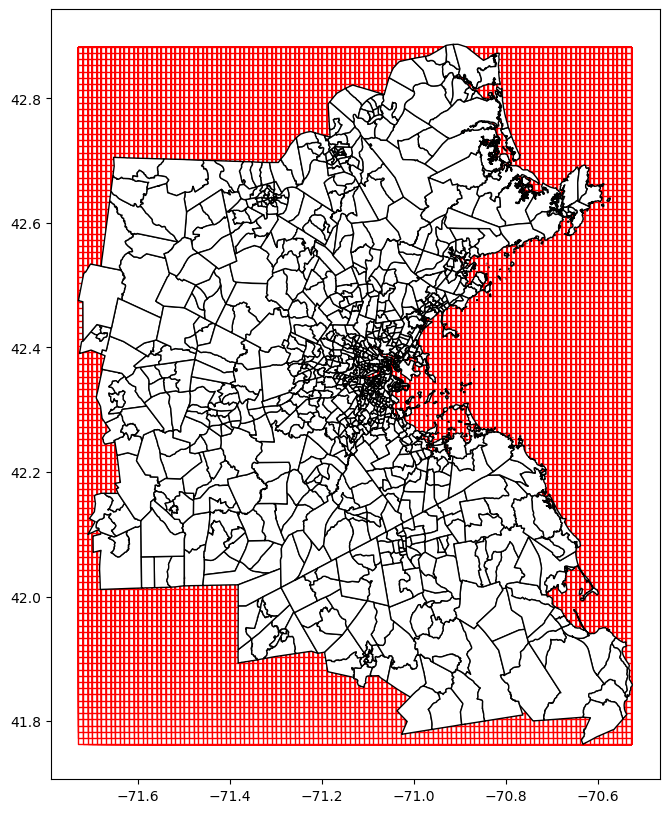

In [ ]:
grid_size = 0.01 
centroid = gdf_polygons.geometry.unary_union.centroid
bounding_box = gdf_polygons.geometry.unary_union.bounds
bbox = shp.geometry.box(*bounding_box)
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox], crs=gdf_polygons.crs)

x = np.arange(bounding_box[0], bounding_box[2], grid_size)
y = np.arange(bounding_box[1], bounding_box[3], grid_size)
grid_points = gpd.GeoDataFrame(geometry=[shp.geometry.box(xi, yi,maxx = max(x),maxy = max(y)) for xi in x for yi in y], crs=gdf_polygons.crs)
ij = [[i,j] for i in range(len(x)) for j in range(len(y))]
grid_points['i'] = np.array(ij)[:,0]
grid_points['j'] = np.array(ij)[:,1]
# Clip the grid to the bounding box
grid = gpd.overlay(grid_points, bbox_gdf, how='intersection')
idx2grid = {idx:grid for idx,grid in enumerate(grid)}
fig,ax = plt.subplots(1,1,figsize = (10,10))
grid.plot(ax=ax, color='white', alpha=1,edgecolor = 'red')
gdf_polygons.plot(ax=ax, color='white',alpha = 1, edgecolor='black')


total number hexagon with population:  6875
number of polygons:  974
Checking one hexagon time:  0.0028777122497558594
Checking one hexagon time:  0.0030879974365234375
Checking one hexagon time:  0.0026984214782714844
Checking one hexagon time:  0.003080129623413086
Checking one hexagon time:  0.0048007965087890625
Checking one hexagon time:  0.0037543773651123047
Checking one hexagon time:  0.004403114318847656
Checking one hexagon time:  0.003698587417602539
Checking one hexagon time:  0.0037729740142822266
Checking one hexagon time:  0.0032410621643066406
Checking one hexagon time:  0.003630399703979492
Checking one hexagon time:  0.003581523895263672
Checking one hexagon time:  0.003184080123901367
Checking one hexagon time:  0.0031957626342773438
Checking one hexagon time:  0.0031304359436035156
Checking one hexagon time:  0.0030660629272460938
Checking one hexagon time:  0.004008054733276367
Checking one hexagon time:  0.0041599273681640625
Checking one hexagon time:  0.00487947

NameError: name 'gdf_poygons' is not defined

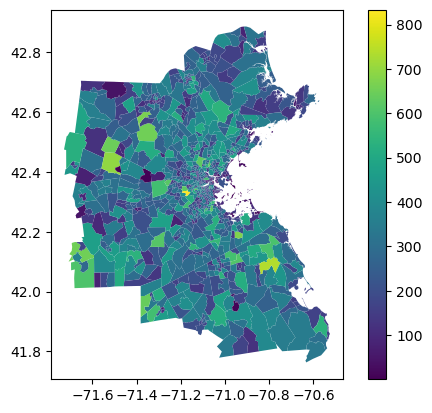

In [ ]:
import time
import multiprocessing as mp
#grid_with_indices = gpd.overlay(grid_points, bbox_gdf, how='identity')
#grid.plot(color='white', alpha=1,edgecolor = 'black')
print('total number hexagon with population: ',len(gdf_hexagons.loc[gdf_hexagons['population'] > 0]))
print('number of polygons: ',len(gdf_polygons))
polygon_sindex = gdf_polygons.sindex
populationpolygon = np.zeros(len(gdf_polygons))
for idxh,hex in gdf_hexagons.loc[gdf_hexagons['population'] > 0].iterrows():
    t0 = time.time()    
    possible_matches_index = list(polygon_sindex.intersection(hex.geometry.bounds))
    possible_matches = gdf_polygons.iloc[possible_matches_index]
        
    # Filter based on actual intersection
    if len(possible_matches) > 0:
        intersecting = possible_matches[possible_matches.geometry.intersects(hex.geometry)]
        for idxint,int_ in intersecting.iterrows():
            populationpolygon[idxint] += hex.population*int_.geometry.intersection(hex.geometry).area/hex.geometry.area        
            if int_.geometry.intersection(hex.geometry).area/hex.geometry.area>1.01:
                raise ValueError('Error the area of the intersection is greater than 1: ',int_.geometry.intersection(hex.geometry).area/hex.geometry.area)
    else:
        pass
    t1 = time.time()

    print('Checking one hexagon time: ',t1-t0)
    gdf_polygons['population'] = populationpolygon
gdf_polygons.plot(column='population',legend=True)
#bbox_gdf.plot()

<AxesSubplot: >

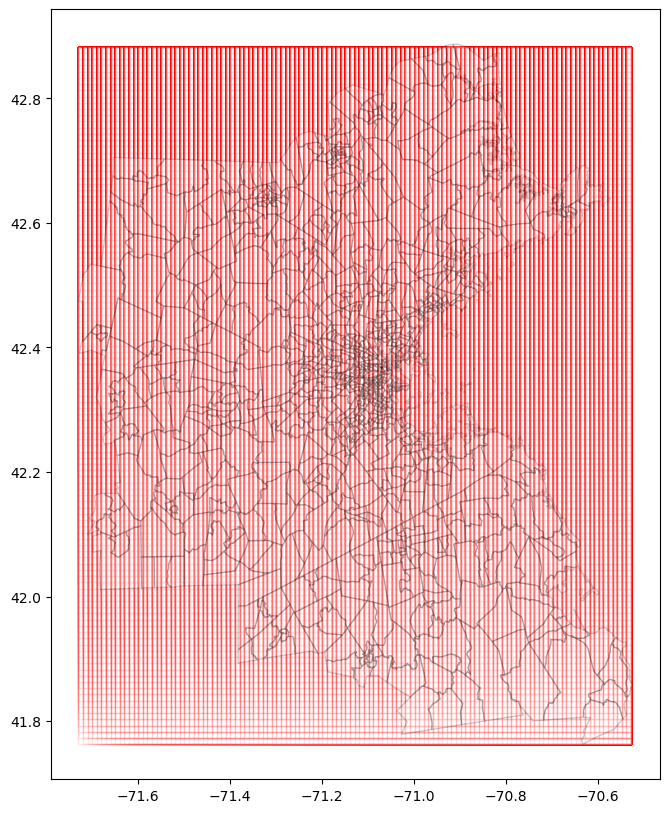

In [ ]:
fig,ax = plt.subplots(1,1,figsize = (10,10))
grid.plot(ax=ax, color='white', alpha=0.1,edgecolor = 'red')
gdf_polygons.plot(ax=ax, color='white',alpha = 0.2, edgecolor='black')


[]

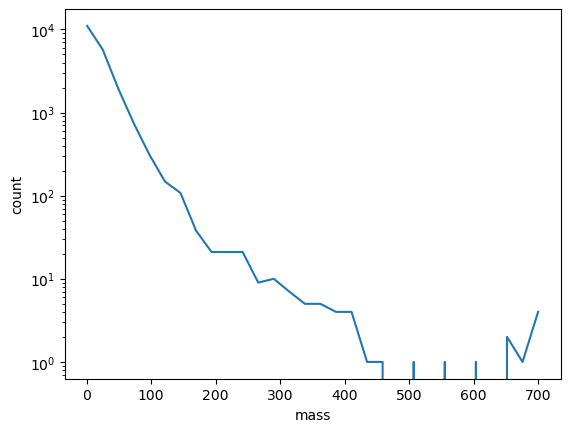

In [ ]:
# FITTING THE GRAVITATIONAL MODEL
mask = [True if m>0 else False for m in matrix_out]
n,bins = np.histogram(matrix_out[mask],bins = 30)
plt.plot(bins[:-1],n)
plt.xlabel('mass')
plt.ylabel('count')
plt.semilogy()

In [ ]:
def generic_potential(alpha,beta)

R = 10
theta = np.linspace(0,2*np.pi,1000)
r = np.linspace(0,R,1000)
def gradient_field(R,theta,d0,r0):
    r*(-1 +d0/r + d0*r0*np.cos(theta)/r**2)*(1-np.cos(theta)/d0)*np.exp(+r/d0)
    return (R**2 + 1)/(R**2 + 1 - 2*R*np.cos(theta))
for r_ in r:
    for theta_ in theta:
        gradient_field(R,theta_,d0,r0)

SyntaxError: expected ':' (2933566243.py, line 1)

# HOMOTOPY THEORY -> FONDAMENTAL GROUP

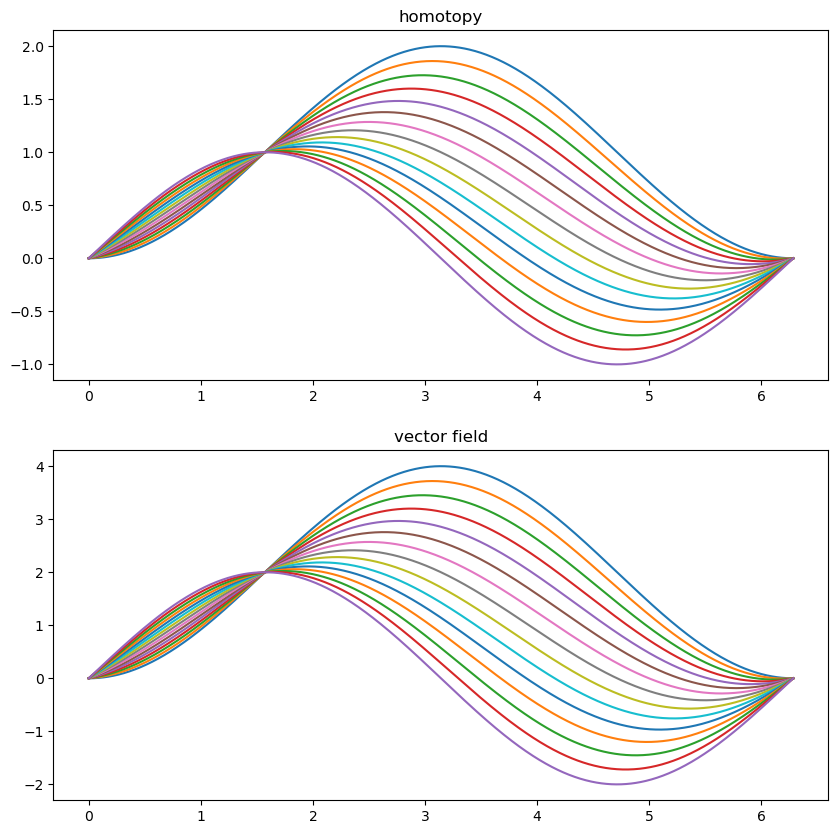

In [ ]:
import matplotlib.pyplot as plt
t = np.linspace(0,1,15)
x0 = 0
x1 = np.pi*2
x = np.linspace(x0,x1,1000)
f0 = np.sin(x)
f1 = 1-np.cos(x)
fig,ax = plt.subplots(2,1,figsize = (10,10))
for i in range(len(t)):
    f = t[i]*f0 + (1-t[i])*f1
    vf = (t[i]*f0 + (1-t[i])*f1) + (t[i]*f0 + (1-t[i])*f1)
    ax[0].plot(x,f)
    ax[0].set_title('homotopy')
    ax[1].plot(x,vf)
    ax[1].set_title('vector field')

In [325]:
import pandas as pd
import os
import matplotlib.pyplot as plt

def second2hour(seconds_in_day):
    '''
        Output:
            Vector of 24 values containing each hour in second unit
    '''
    hour_in_day = [sec for sec in seconds_in_day if sec%3600 == 0]
    return hour_in_day

def in_net_people_time(df_people,save_dir,name,hour_in_day=24,minutes_in_hour=60,seconds_in_minute=60,interval_in_minutes = 15):
    '''
        Shows the unloading of the graph on time
    '''
    number_people_staying = []
    interval_minutes = hour_in_day*minutes_in_hour*interval_in_minutes
    seconds_per_day = hour_in_day*minutes_in_hour*seconds_in_minute
    interval15 = np.linspace(0,seconds_per_day,interval_minutes) # Spits intervals of seconds every 15 minutes [0,900,...,]
    time_exit = df_people['time_departure'].to_numpy() + np.sum(df_people['travel_time'].to_numpy(),axis = 1)
    df_people['time_exit'] = time_exit
    for interval in interval15:
        number_people_staying.append(len(np.where(df_people['time_exit'].to_numpy()<interval))) 
    fig,ax = plt.subplots(1,1,figsize = (15,15))
    ax.scatter(interval15,number_people_staying)
    ax.set_xlabel('time')
    ax.set_ylabel('Number people in graph')
    plt.savefig(os.path.join(save_dir,name)+'.png',dpi = 200)
    plt.show()



if __name__=='__main__':
    output_dir = '/home/aamad/Desktop/phd/berkeley/data/BOS/R_1/'
    for file in os.listdir(output_dir):
        if 'people' in file:
            print('file: ',os.path.join(output_dir,file))
            df_people = pd.read_csv(os.path.join(output_dir,file))
            name = 'unloading_'+file
            in_net_people_time(df_people,output_dir,name)

        elif 'route' in file:
            print('file: ',os.path.join(output_dir,file))
            with open(os.path.join(output_dir,file)) as f:
                lines = f.readlines()
                print('number of lines: ',len(lines))
                print('first line: ',lines[0])
                print('last line: ',lines[-1])
                print('number of people: ',len(lines)-1)
#            df_people = pd.read_csv(os.path.join(output_dir,file),',')


file:  /home/aamad/Desktop/phd/berkeley/data/BOS/R_1/0_route7to24.csv
number of lines:  374984
first line:  p:route:distance

last line:  374982:[9485,9525,9407]:2087.2

number of people:  374983
file:  /home/aamad/Desktop/phd/berkeley/data/BOS/R_1/0_people5to12.csv


KeyError: 'travel_time'

In [ ]:
time_interval = 1
divisions = 1000
dt = np.linspace(0,time_interval,divisions)
Wiener_field = np.random.normal(0,1,(3,divisions))
covariance_matrix = np.array([[1,0,0],[0,1,0],[0,0,1]])


In [ ]:
import pymc as pm
count_data = matrix_in
count_data = matrix_out
n_count_data = len(count_data)
alpha = 1.0 / count_data.mean()  # Recall count_data is the
                               # variable that holds our txt counts
lambda_1 = pm.Exponential("lambda_1", alpha)
lambda_2 = pm.Exponential("lambda_2", alpha)

tau = pm.DiscreteUniform("tau", lower=0, upper=n_count_data)
print("Random output:", tau.random(), tau.random(), tau.random())
@pm.deterministic
def lambda_(tau=tau, lambda_1=lambda_1, lambda_2=lambda_2):
    out = np.zeros(n_count_data)
    out[:tau] = lambda_1  # lambda before tau is lambda1
    out[tau:] = lambda_2  # lambda after (and including) tau is lambda2
    return out
observation = pm.Poisson("obs", lambda_, value=count_data, observed=True)
model = pm.Model([observation, lambda_1, lambda_2, tau])
mcmc = pm.MCMC(model)
mcmc.sample(40000, 10000, 1)
lambda_1_samples = mcmc.trace('lambda_1')[:]
lambda_2_samples = mcmc.trace('lambda_2')[:]
tau_samples = mcmc.trace('tau')[:]
plt.figsize(12.5, 10)
# histogram of the samples:

ax = plt.subplot(311)
ax.set_autoscaley_on(False)

plt.hist(lambda_1_samples, histtype='stepfilled', bins=30, alpha=0.85,
         label="posterior of $\lambda_1$", color="#A60628", density=True)
plt.legend(loc="upper left")
plt.title(r"""Posterior distributions of the variables
    $\lambda_1,\;\lambda_2,\;\tau$""")
plt.xlim([15, 30])
plt.xlabel("$\lambda_1$ value")

ax = plt.subplot(312)
ax.set_autoscaley_on(False)
plt.hist(lambda_2_samples, histtype='stepfilled', bins=30, alpha=0.85,
         label="posterior of $\lambda_2$", color="#7A68A6", density=True)
plt.legend(loc="upper left")
plt.xlim([15, 30])
plt.xlabel("$\lambda_2$ value")

plt.subplot(313)
w = 1.0 / tau_samples.shape[0] * np.ones_like(tau_samples)
plt.hist(tau_samples, bins=n_count_data, alpha=1,
         label=r"posterior of $\tau$",
         color="#467821", weights=w, rwidth=2.)
plt.xticks(np.arange(n_count_data))

plt.legend(loc="upper left")
plt.ylim([0, .75])
plt.xlim([35, len(count_data) - 20])
plt.xlabel(r"$\tau$ (in days)")
plt.ylabel("probability")
plt.show()
plt.figsize(12.5, 5)
# tau_samples, lambda_1_samples, lambda_2_samples contain
# N samples from the corresponding posterior distribution
N = tau_samples.shape[0]
expected_texts_per_day = np.zeros(n_count_data)
for day in range(0, n_count_data):
    # ix is a bool index of all tau samples corresponding to
    # the switchpoint occurring prior to value of 'day'
    ix = day < tau_samples
    # Each posterior sample corresponds to a value for tau.
    # for each day, that value of tau indicates whether we're "before"
    # (in the lambda1 "regime") or
    #  "after" (in the lambda2 "regime") the switchpoint.
    # by taking the posterior sample of lambda1/2 accordingly, we can average
    # over all samples to get an expected value for lambda on that day.
    # As explained, the "message count" random variable is Poisson distributed,
    # and therefore lambda (the poisson parameter) is the expected value of
    # "message count".
    expected_texts_per_day[day] = (lambda_1_samples[ix].sum()
                                   + lambda_2_samples[~ix].sum()) / N


plt.plot(range(n_count_data), expected_texts_per_day, lw=4, color="#E24A33",
         label="expected number of text-messages received")
plt.xlim(0, n_count_data)
plt.xlabel("Day")
plt.ylabel("Expected # text-messages")
plt.title("Expected number of text-messages received")
plt.ylim(0, 60)
plt.bar(np.arange(len(count_data)), count_data, color="#348ABD", alpha=0.65,
        label="observed texts per day")

plt.legend(loc="upper left")

TypeError: No model on context stack, which is needed to instantiate distributions. Add variable inside a 'with model:' block, or use the '.dist' syntax for a standalone distribution.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

npeople = np.linspace(0,1000,1000)
nplaces = np.linspace(0,1000,1000)



# COUNT PEOPLE COVID

In [ ]:
from collections import defaultdict
import ast
data_string = """
not preprocessed df:	 12602986
number of people 15 jan - 15 march:	 19818
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17145, '2020-01-22 00:00:00': 17498, '2020-01-29 00:00:00': 17817, '2020-02-05 00:00:00': 18095, '2020-02-12 00:00:00': 18440, '2020-02-19 00:00:00': 18705, '2020-02-26 00:00:00': 18600, '2020-03-04 00:00:00': 18447, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 19818
total number of points period 15 jan - 15 march:	 3285714
number of people 15 march - 15 may:	 16368
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14593, '2020-03-22 00:00:00': 12940, '2020-03-29 00:00:00': 12867, '2020-04-05 00:00:00': 11876, '2020-04-12 00:00:00': 12347, '2020-04-19 00:00:00': 12434, '2020-04-26 00:00:00': 12513, '2020-05-03 00:00:00': 12613, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 16368
total number of points period 15 march - 15 may:	 1517087
number of people 15 may - sept:	 15520
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12448, '2020-05-22 00:00:00': 12814, '2020-05-29 00:00:00': 12693, '2020-06-05 00:00:00': 12817, '2020-06-12 00:00:00': 12570, '2020-06-19 00:00:00': 12485, '2020-06-26 00:00:00': 12178, '2020-07-03 00:00:00': 11856, '2020-07-10 00:00:00': 11642, '2020-07-17 00:00:00': 11477, '2020-07-24 00:00:00': 11330, '2020-07-31 00:00:00': 11183, '2020-08-07 00:00:00': 11026, '2020-08-14 00:00:00': 10652, '2020-08-21 00:00:00': 10343, '2020-08-28 00:00:00': 10477, '2020-09-04 00:00:00': 10308, '2020-09-11 00:00:00': 8671, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 15520
total number of points period 15 may - sept:	 3259088
not preprocessed df:	 12509813
number of people 15 jan - 15 march:	 39288
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16855, '2020-01-22 00:00:00': 17095, '2020-01-29 00:00:00': 17431, '2020-02-05 00:00:00': 17771, '2020-02-12 00:00:00': 18069, '2020-02-19 00:00:00': 18313, '2020-02-26 00:00:00': 18321, '2020-03-04 00:00:00': 18213, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 39288
total number of points period 15 jan - 15 march:	 6526832
number of people 15 march - 15 may:	 32431
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14330, '2020-03-22 00:00:00': 12791, '2020-03-29 00:00:00': 12630, '2020-04-05 00:00:00': 11704, '2020-04-12 00:00:00': 12188, '2020-04-19 00:00:00': 12315, '2020-04-26 00:00:00': 12331, '2020-05-03 00:00:00': 12326, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 32431
total number of points period 15 march - 15 may:	 3016802
number of people 15 may - sept:	 30782
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12188, '2020-05-22 00:00:00': 12547, '2020-05-29 00:00:00': 12358, '2020-06-05 00:00:00': 12471, '2020-06-12 00:00:00': 12422, '2020-06-19 00:00:00': 12195, '2020-06-26 00:00:00': 11942, '2020-07-03 00:00:00': 11576, '2020-07-10 00:00:00': 11459, '2020-07-17 00:00:00': 11227, '2020-07-24 00:00:00': 11107, '2020-07-31 00:00:00': 10968, '2020-08-07 00:00:00': 10815, '2020-08-14 00:00:00': 10533, '2020-08-21 00:00:00': 10262, '2020-08-28 00:00:00': 10283, '2020-09-04 00:00:00': 10096, '2020-09-11 00:00:00': 8574, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 30782
total number of points period 15 may - sept:	 6483363
not preprocessed df:	 13139097
number of people 15 jan - 15 march:	 60040
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17912, '2020-01-22 00:00:00': 18286, '2020-01-29 00:00:00': 18504, '2020-02-05 00:00:00': 18969, '2020-02-12 00:00:00': 19342, '2020-02-19 00:00:00': 19583, '2020-02-26 00:00:00': 19546, '2020-03-04 00:00:00': 19359, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 60040
total number of points period 15 jan - 15 march:	 9965841
number of people 15 march - 15 may:	 49420
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 15160, '2020-03-22 00:00:00': 13403, '2020-03-29 00:00:00': 13285, '2020-04-05 00:00:00': 12169, '2020-04-12 00:00:00': 12898, '2020-04-19 00:00:00': 12975, '2020-04-26 00:00:00': 13077, '2020-05-03 00:00:00': 13114, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 49420
total number of points period 15 march - 15 may:	 4586182
number of people 15 may - sept:	 47041
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 13025, '2020-05-22 00:00:00': 13327, '2020-05-29 00:00:00': 13260, '2020-06-05 00:00:00': 13426, '2020-06-12 00:00:00': 13141, '2020-06-19 00:00:00': 13073, '2020-06-26 00:00:00': 12743, '2020-07-03 00:00:00': 12513, '2020-07-10 00:00:00': 12190, '2020-07-17 00:00:00': 12048, '2020-07-24 00:00:00': 11825, '2020-07-31 00:00:00': 11646, '2020-08-07 00:00:00': 11512, '2020-08-14 00:00:00': 11178, '2020-08-21 00:00:00': 10799, '2020-08-28 00:00:00': 10872, '2020-09-04 00:00:00': 10649, '2020-09-11 00:00:00': 9066, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 47041
total number of points period 15 may - sept:	 9878516
not preprocessed df:	 11863070
number of people 15 jan - 15 march:	 78703
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16196, '2020-01-22 00:00:00': 16542, '2020-01-29 00:00:00': 16807, '2020-02-05 00:00:00': 17073, '2020-02-12 00:00:00': 17369, '2020-02-19 00:00:00': 17584, '2020-02-26 00:00:00': 17509, '2020-03-04 00:00:00': 17396, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 78703
total number of points period 15 jan - 15 march:	 13056503
number of people 15 march - 15 may:	 64788
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 13684, '2020-03-22 00:00:00': 12195, '2020-03-29 00:00:00': 12082, '2020-04-05 00:00:00': 11038, '2020-04-12 00:00:00': 11624, '2020-04-19 00:00:00': 11705, '2020-04-26 00:00:00': 11689, '2020-05-03 00:00:00': 11752, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 64788
total number of points period 15 march - 15 may:	 6003326
number of people 15 may - sept:	 61667
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 11648, '2020-05-22 00:00:00': 12042, '2020-05-29 00:00:00': 11872, '2020-06-05 00:00:00': 11926, '2020-06-12 00:00:00': 11915, '2020-06-19 00:00:00': 11768, '2020-06-26 00:00:00': 11487, '2020-07-03 00:00:00': 11208, '2020-07-10 00:00:00': 10972, '2020-07-17 00:00:00': 10776, '2020-07-24 00:00:00': 10636, '2020-07-31 00:00:00': 10502, '2020-08-07 00:00:00': 10378, '2020-08-14 00:00:00': 10001, '2020-08-21 00:00:00': 9704, '2020-08-28 00:00:00': 9768, '2020-09-04 00:00:00': 9625, '2020-09-11 00:00:00': 8156, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 61667
total number of points period 15 may - sept:	 12924947
not preprocessed df:	 13180624
number of people 15 jan - 15 march:	 99409
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17884, '2020-01-22 00:00:00': 18237, '2020-01-29 00:00:00': 18532, '2020-02-05 00:00:00': 18952, '2020-02-12 00:00:00': 19237, '2020-02-19 00:00:00': 19515, '2020-02-26 00:00:00': 19462, '2020-03-04 00:00:00': 19283, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 99409
total number of points period 15 jan - 15 march:	 16491527
number of people 15 march - 15 may:	 81986
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 15349, '2020-03-22 00:00:00': 13640, '2020-03-29 00:00:00': 13511, '2020-04-05 00:00:00': 12360, '2020-04-12 00:00:00': 12976, '2020-04-19 00:00:00': 13110, '2020-04-26 00:00:00': 13170, '2020-05-03 00:00:00': 13216, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 81986
total number of points period 15 march - 15 may:	 7592315
number of people 15 may - sept:	 77977
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 13122, '2020-05-22 00:00:00': 13520, '2020-05-29 00:00:00': 13328, '2020-06-05 00:00:00': 13410, '2020-06-12 00:00:00': 13119, '2020-06-19 00:00:00': 12947, '2020-06-26 00:00:00': 12711, '2020-07-03 00:00:00': 12414, '2020-07-10 00:00:00': 12197, '2020-07-17 00:00:00': 12028, '2020-07-24 00:00:00': 11801, '2020-07-31 00:00:00': 11609, '2020-08-07 00:00:00': 11468, '2020-08-14 00:00:00': 11099, '2020-08-21 00:00:00': 10780, '2020-08-28 00:00:00': 10908, '2020-09-04 00:00:00': 10672, '2020-09-11 00:00:00': 8973, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 77977
total number of points period 15 may - sept:	 16330786
not preprocessed df:	 12825635
number of people 15 jan - 15 march:	 119414
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17342, '2020-01-22 00:00:00': 17671, '2020-01-29 00:00:00': 17935, '2020-02-05 00:00:00': 18229, '2020-02-12 00:00:00': 18570, '2020-02-19 00:00:00': 18812, '2020-02-26 00:00:00': 18832, '2020-03-04 00:00:00': 18673, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 119414
total number of points period 15 jan - 15 march:	 19824061
number of people 15 march - 15 may:	 98516
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14739, '2020-03-22 00:00:00': 13143, '2020-03-29 00:00:00': 13038, '2020-04-05 00:00:00': 11955, '2020-04-12 00:00:00': 12559, '2020-04-19 00:00:00': 12621, '2020-04-26 00:00:00': 12810, '2020-05-03 00:00:00': 12714, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 98516
total number of points period 15 march - 15 may:	 9132196
number of people 15 may - sept:	 93659
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12555, '2020-05-22 00:00:00': 12976, '2020-05-29 00:00:00': 12774, '2020-06-05 00:00:00': 12830, '2020-06-12 00:00:00': 12688, '2020-06-19 00:00:00': 12542, '2020-06-26 00:00:00': 12270, '2020-07-03 00:00:00': 11997, '2020-07-10 00:00:00': 11796, '2020-07-17 00:00:00': 11594, '2020-07-24 00:00:00': 11419, '2020-07-31 00:00:00': 11295, '2020-08-07 00:00:00': 11146, '2020-08-14 00:00:00': 10824, '2020-08-21 00:00:00': 10453, '2020-08-28 00:00:00': 10490, '2020-09-04 00:00:00': 10293, '2020-09-11 00:00:00': 8834, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 93659
total number of points period 15 may - sept:	 19636200
not preprocessed df:	 11674060
number of people 15 jan - 15 march:	 137686
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 15743, '2020-01-22 00:00:00': 16075, '2020-01-29 00:00:00': 16356, '2020-02-05 00:00:00': 16658, '2020-02-12 00:00:00': 16975, '2020-02-19 00:00:00': 17194, '2020-02-26 00:00:00': 17193, '2020-03-04 00:00:00': 17067, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 137686
total number of points period 15 jan - 15 march:	 22857084
number of people 15 march - 15 may:	 113532
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 13359, '2020-03-22 00:00:00': 11872, '2020-03-29 00:00:00': 11828, '2020-04-05 00:00:00': 10795, '2020-04-12 00:00:00': 11361, '2020-04-19 00:00:00': 11478, '2020-04-26 00:00:00': 11590, '2020-05-03 00:00:00': 11610, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 113532
total number of points period 15 march - 15 may:	 10518068
number of people 15 may - sept:	 108038
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 11463, '2020-05-22 00:00:00': 11833, '2020-05-29 00:00:00': 11695, '2020-06-05 00:00:00': 11841, '2020-06-12 00:00:00': 11651, '2020-06-19 00:00:00': 11530, '2020-06-26 00:00:00': 11278, '2020-07-03 00:00:00': 11086, '2020-07-10 00:00:00': 10829, '2020-07-17 00:00:00': 10595, '2020-07-24 00:00:00': 10447, '2020-07-31 00:00:00': 10330, '2020-08-07 00:00:00': 10232, '2020-08-14 00:00:00': 9888, '2020-08-21 00:00:00': 9635, '2020-08-28 00:00:00': 9704, '2020-09-04 00:00:00': 9533, '2020-09-11 00:00:00': 8095, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 108038
total number of points period 15 may - sept:	 22664389
not preprocessed df:	 13146536
number of people 15 jan - 15 march:	 158235
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17783, '2020-01-22 00:00:00': 18158, '2020-01-29 00:00:00': 18449, '2020-02-05 00:00:00': 18778, '2020-02-12 00:00:00': 19140, '2020-02-19 00:00:00': 19350, '2020-02-26 00:00:00': 19345, '2020-03-04 00:00:00': 19190, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 158235
total number of points period 15 jan - 15 march:	 26278346
number of people 15 march - 15 may:	 130508
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 15175, '2020-03-22 00:00:00': 13340, '2020-03-29 00:00:00': 13298, '2020-04-05 00:00:00': 12178, '2020-04-12 00:00:00': 12802, '2020-04-19 00:00:00': 12930, '2020-04-26 00:00:00': 13021, '2020-05-03 00:00:00': 13004, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 130508
total number of points period 15 march - 15 may:	 12084107
number of people 15 may - sept:	 124264
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12996, '2020-05-22 00:00:00': 13300, '2020-05-29 00:00:00': 13143, '2020-06-05 00:00:00': 13317, '2020-06-12 00:00:00': 13104, '2020-06-19 00:00:00': 12960, '2020-06-26 00:00:00': 12675, '2020-07-03 00:00:00': 12399, '2020-07-10 00:00:00': 12180, '2020-07-17 00:00:00': 11945, '2020-07-24 00:00:00': 11778, '2020-07-31 00:00:00': 11612, '2020-08-07 00:00:00': 11522, '2020-08-14 00:00:00': 11122, '2020-08-21 00:00:00': 10799, '2020-08-28 00:00:00': 10879, '2020-09-04 00:00:00': 10711, '2020-09-11 00:00:00': 9046, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 124264
total number of points period 15 may - sept:	 26054359
not preprocessed df:	 12695950
number of people 15 jan - 15 march:	 178243
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17313, '2020-01-22 00:00:00': 17607, '2020-01-29 00:00:00': 17872, '2020-02-05 00:00:00': 18222, '2020-02-12 00:00:00': 18580, '2020-02-19 00:00:00': 18833, '2020-02-26 00:00:00': 18771, '2020-03-04 00:00:00': 18666, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 178243
total number of points period 15 jan - 15 march:	 29588305
number of people 15 march - 15 may:	 147021
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14709, '2020-03-22 00:00:00': 13000, '2020-03-29 00:00:00': 12883, '2020-04-05 00:00:00': 11742, '2020-04-12 00:00:00': 12408, '2020-04-19 00:00:00': 12513, '2020-04-26 00:00:00': 12512, '2020-05-03 00:00:00': 12648, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 147021
total number of points period 15 march - 15 may:	 13596414
number of people 15 may - sept:	 139977
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12559, '2020-05-22 00:00:00': 12885, '2020-05-29 00:00:00': 12744, '2020-06-05 00:00:00': 12806, '2020-06-12 00:00:00': 12661, '2020-06-19 00:00:00': 12522, '2020-06-26 00:00:00': 12302, '2020-07-03 00:00:00': 12014, '2020-07-10 00:00:00': 11800, '2020-07-17 00:00:00': 11570, '2020-07-24 00:00:00': 11425, '2020-07-31 00:00:00': 11305, '2020-08-07 00:00:00': 11128, '2020-08-14 00:00:00': 10864, '2020-08-21 00:00:00': 10441, '2020-08-28 00:00:00': 10559, '2020-09-04 00:00:00': 10355, '2020-09-11 00:00:00': 8809, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 139977
total number of points period 15 may - sept:	 29335848
not preprocessed df:	 11743348
number of people 15 jan - 15 march:	 196620
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 15849, '2020-01-22 00:00:00': 16170, '2020-01-29 00:00:00': 16453, '2020-02-05 00:00:00': 16725, '2020-02-12 00:00:00': 17032, '2020-02-19 00:00:00': 17292, '2020-02-26 00:00:00': 17310, '2020-03-04 00:00:00': 17129, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 196620
total number of points period 15 jan - 15 march:	 32634838
number of people 15 march - 15 may:	 162080
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 13428, '2020-03-22 00:00:00': 11924, '2020-03-29 00:00:00': 11832, '2020-04-05 00:00:00': 10988, '2020-04-12 00:00:00': 11501, '2020-04-19 00:00:00': 11586, '2020-04-26 00:00:00': 11658, '2020-05-03 00:00:00': 11657, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 162080
total number of points period 15 march - 15 may:	 15009721
number of people 15 may - sept:	 154339
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 11512, '2020-05-22 00:00:00': 11853, '2020-05-29 00:00:00': 11704, '2020-06-05 00:00:00': 11830, '2020-06-12 00:00:00': 11717, '2020-06-19 00:00:00': 11602, '2020-06-26 00:00:00': 11316, '2020-07-03 00:00:00': 11042, '2020-07-10 00:00:00': 10849, '2020-07-17 00:00:00': 10594, '2020-07-24 00:00:00': 10475, '2020-07-31 00:00:00': 10346, '2020-08-07 00:00:00': 10236, '2020-08-14 00:00:00': 9912, '2020-08-21 00:00:00': 9581, '2020-08-28 00:00:00': 9670, '2020-09-04 00:00:00': 9451, '2020-09-11 00:00:00': 8049, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 154339
total number of points period 15 may - sept:	 32369707
not preprocessed df:	 13168043
number of people 15 jan - 15 march:	 217255
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17822, '2020-01-22 00:00:00': 18115, '2020-01-29 00:00:00': 18494, '2020-02-05 00:00:00': 18840, '2020-02-12 00:00:00': 19199, '2020-02-19 00:00:00': 19379, '2020-02-26 00:00:00': 19395, '2020-03-04 00:00:00': 19260, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 217255
total number of points period 15 jan - 15 march:	 36054163
number of people 15 march - 15 may:	 179129
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 15202, '2020-03-22 00:00:00': 13532, '2020-03-29 00:00:00': 13373, '2020-04-05 00:00:00': 12277, '2020-04-12 00:00:00': 12876, '2020-04-19 00:00:00': 13061, '2020-04-26 00:00:00': 13090, '2020-05-03 00:00:00': 13103, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 179129
total number of points period 15 march - 15 may:	 16585264
number of people 15 may - sept:	 170577
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 13024, '2020-05-22 00:00:00': 13365, '2020-05-29 00:00:00': 13251, '2020-06-05 00:00:00': 13423, '2020-06-12 00:00:00': 13185, '2020-06-19 00:00:00': 13006, '2020-06-26 00:00:00': 12730, '2020-07-03 00:00:00': 12539, '2020-07-10 00:00:00': 12214, '2020-07-17 00:00:00': 11997, '2020-07-24 00:00:00': 11833, '2020-07-31 00:00:00': 11662, '2020-08-07 00:00:00': 11564, '2020-08-14 00:00:00': 11125, '2020-08-21 00:00:00': 10826, '2020-08-28 00:00:00': 10891, '2020-09-04 00:00:00': 10722, '2020-09-11 00:00:00': 9047, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 170577
total number of points period 15 may - sept:	 35791773
not preprocessed df:	 12285989
number of people 15 jan - 15 march:	 236710
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16839, '2020-01-22 00:00:00': 17207, '2020-01-29 00:00:00': 17509, '2020-02-05 00:00:00': 17789, '2020-02-12 00:00:00': 18105, '2020-02-19 00:00:00': 18239, '2020-02-26 00:00:00': 18218, '2020-03-04 00:00:00': 18099, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 236710
total number of points period 15 jan - 15 march:	 39260880
number of people 15 march - 15 may:	 195147
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14260, '2020-03-22 00:00:00': 12589, '2020-03-29 00:00:00': 12435, '2020-04-05 00:00:00': 11462, '2020-04-12 00:00:00': 12030, '2020-04-19 00:00:00': 12161, '2020-04-26 00:00:00': 12236, '2020-05-03 00:00:00': 12303, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 195147
total number of points period 15 march - 15 may:	 18054976
number of people 15 may - sept:	 185833
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12213, '2020-05-22 00:00:00': 12578, '2020-05-29 00:00:00': 12429, '2020-06-05 00:00:00': 12506, '2020-06-12 00:00:00': 12336, '2020-06-19 00:00:00': 12208, '2020-06-26 00:00:00': 11878, '2020-07-03 00:00:00': 11574, '2020-07-10 00:00:00': 11441, '2020-07-17 00:00:00': 11194, '2020-07-24 00:00:00': 11052, '2020-07-31 00:00:00': 10891, '2020-08-07 00:00:00': 10746, '2020-08-14 00:00:00': 10398, '2020-08-21 00:00:00': 10137, '2020-08-28 00:00:00': 10151, '2020-09-04 00:00:00': 9988, '2020-09-11 00:00:00': 8511, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 185833
total number of points period 15 may - sept:	 38964378
not preprocessed df:	 12436580
number of people 15 jan - 15 march:	 256368
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17011, '2020-01-22 00:00:00': 17318, '2020-01-29 00:00:00': 17635, '2020-02-05 00:00:00': 17950, '2020-02-12 00:00:00': 18349, '2020-02-19 00:00:00': 18581, '2020-02-26 00:00:00': 18512, '2020-03-04 00:00:00': 18344, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 256368
total number of points period 15 jan - 15 march:	 42516910
number of people 15 march - 15 may:	 211379
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14463, '2020-03-22 00:00:00': 12862, '2020-03-29 00:00:00': 12779, '2020-04-05 00:00:00': 11640, '2020-04-12 00:00:00': 12252, '2020-04-19 00:00:00': 12360, '2020-04-26 00:00:00': 12436, '2020-05-03 00:00:00': 12478, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 211379
total number of points period 15 march - 15 may:	 19553568
number of people 15 may - sept:	 201219
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12286, '2020-05-22 00:00:00': 12692, '2020-05-29 00:00:00': 12459, '2020-06-05 00:00:00': 12619, '2020-06-12 00:00:00': 12451, '2020-06-19 00:00:00': 12252, '2020-06-26 00:00:00': 11969, '2020-07-03 00:00:00': 11666, '2020-07-10 00:00:00': 11443, '2020-07-17 00:00:00': 11239, '2020-07-24 00:00:00': 11056, '2020-07-31 00:00:00': 10935, '2020-08-07 00:00:00': 10801, '2020-08-14 00:00:00': 10448, '2020-08-21 00:00:00': 10168, '2020-08-28 00:00:00': 10217, '2020-09-04 00:00:00': 10050, '2020-09-11 00:00:00': 8550, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 201219
total number of points period 15 may - sept:	 42162788
not preprocessed df:	 12013418
number of people 15 jan - 15 march:	 275216
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16313, '2020-01-22 00:00:00': 16666, '2020-01-29 00:00:00': 16903, '2020-02-05 00:00:00': 17219, '2020-02-12 00:00:00': 17512, '2020-02-19 00:00:00': 17750, '2020-02-26 00:00:00': 17774, '2020-03-04 00:00:00': 17605, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 275216
total number of points period 15 jan - 15 march:	 45627087
number of people 15 march - 15 may:	 226943
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 13828, '2020-03-22 00:00:00': 12393, '2020-03-29 00:00:00': 12195, '2020-04-05 00:00:00': 11226, '2020-04-12 00:00:00': 11790, '2020-04-19 00:00:00': 11876, '2020-04-26 00:00:00': 11953, '2020-05-03 00:00:00': 11966, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 226943
total number of points period 15 march - 15 may:	 20996414
number of people 15 may - sept:	 215977
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 11799, '2020-05-22 00:00:00': 12112, '2020-05-29 00:00:00': 11961, '2020-06-05 00:00:00': 12101, '2020-06-12 00:00:00': 11998, '2020-06-19 00:00:00': 11794, '2020-06-26 00:00:00': 11568, '2020-07-03 00:00:00': 11363, '2020-07-10 00:00:00': 11151, '2020-07-17 00:00:00': 10916, '2020-07-24 00:00:00': 10730, '2020-07-31 00:00:00': 10613, '2020-08-07 00:00:00': 10483, '2020-08-14 00:00:00': 10200, '2020-08-21 00:00:00': 9907, '2020-08-28 00:00:00': 9976, '2020-09-04 00:00:00': 9756, '2020-09-11 00:00:00': 8265, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 215977
total number of points period 15 may - sept:	 45265664
not preprocessed df:	 12846970
number of people 15 jan - 15 march:	 295333
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17452, '2020-01-22 00:00:00': 17813, '2020-01-29 00:00:00': 18101, '2020-02-05 00:00:00': 18373, '2020-02-12 00:00:00': 18734, '2020-02-19 00:00:00': 19001, '2020-02-26 00:00:00': 18963, '2020-03-04 00:00:00': 18806, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 295333
total number of points period 15 jan - 15 march:	 48976372
number of people 15 march - 15 may:	 243575
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14906, '2020-03-22 00:00:00': 13193, '2020-03-29 00:00:00': 13045, '2020-04-05 00:00:00': 12025, '2020-04-12 00:00:00': 12673, '2020-04-19 00:00:00': 12663, '2020-04-26 00:00:00': 12766, '2020-05-03 00:00:00': 12733, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 243575
total number of points period 15 march - 15 may:	 22533823
number of people 15 may - sept:	 231732
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12634, '2020-05-22 00:00:00': 13001, '2020-05-29 00:00:00': 12904, '2020-06-05 00:00:00': 13015, '2020-06-12 00:00:00': 12834, '2020-06-19 00:00:00': 12700, '2020-06-26 00:00:00': 12372, '2020-07-03 00:00:00': 12139, '2020-07-10 00:00:00': 11848, '2020-07-17 00:00:00': 11639, '2020-07-24 00:00:00': 11416, '2020-07-31 00:00:00': 11319, '2020-08-07 00:00:00': 11210, '2020-08-14 00:00:00': 10826, '2020-08-21 00:00:00': 10495, '2020-08-28 00:00:00': 10599, '2020-09-04 00:00:00': 10440, '2020-09-11 00:00:00': 8838, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 231732
total number of points period 15 may - sept:	 48572517
not preprocessed df:	 12471075
number of people 15 jan - 15 march:	 314813
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16835, '2020-01-22 00:00:00': 17118, '2020-01-29 00:00:00': 17471, '2020-02-05 00:00:00': 17774, '2020-02-12 00:00:00': 18116, '2020-02-19 00:00:00': 18339, '2020-02-26 00:00:00': 18357, '2020-03-04 00:00:00': 18233, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 314813
total number of points period 15 jan - 15 march:	 52211050
number of people 15 march - 15 may:	 259746
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14410, '2020-03-22 00:00:00': 12867, '2020-03-29 00:00:00': 12727, '2020-04-05 00:00:00': 11676, '2020-04-12 00:00:00': 12298, '2020-04-19 00:00:00': 12372, '2020-04-26 00:00:00': 12518, '2020-05-03 00:00:00': 12546, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 259746
total number of points period 15 march - 15 may:	 24030275
number of people 15 may - sept:	 247116
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12409, '2020-05-22 00:00:00': 12698, '2020-05-29 00:00:00': 12544, '2020-06-05 00:00:00': 12670, '2020-06-12 00:00:00': 12450, '2020-06-19 00:00:00': 12289, '2020-06-26 00:00:00': 12035, '2020-07-03 00:00:00': 11735, '2020-07-10 00:00:00': 11484, '2020-07-17 00:00:00': 11360, '2020-07-24 00:00:00': 11223, '2020-07-31 00:00:00': 11042, '2020-08-07 00:00:00': 10866, '2020-08-14 00:00:00': 10570, '2020-08-21 00:00:00': 10255, '2020-08-28 00:00:00': 10342, '2020-09-04 00:00:00': 10102, '2020-09-11 00:00:00': 8602, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 247116
total number of points period 15 may - sept:	 51799034
not preprocessed df:	 12150572
number of people 15 jan - 15 march:	 334139
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16658, '2020-01-22 00:00:00': 16963, '2020-01-29 00:00:00': 17247, '2020-02-05 00:00:00': 17625, '2020-02-12 00:00:00': 17938, '2020-02-19 00:00:00': 18164, '2020-02-26 00:00:00': 18169, '2020-03-04 00:00:00': 18047, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 334139
total number of points period 15 jan - 15 march:	 55398439
number of people 15 march - 15 may:	 275657
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14169, '2020-03-22 00:00:00': 12503, '2020-03-29 00:00:00': 12397, '2020-04-05 00:00:00': 11341, '2020-04-12 00:00:00': 11898, '2020-04-19 00:00:00': 12037, '2020-04-26 00:00:00': 12106, '2020-05-03 00:00:00': 12148, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 275657
total number of points period 15 march - 15 may:	 25488060
number of people 15 may - sept:	 262208
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12023, '2020-05-22 00:00:00': 12454, '2020-05-29 00:00:00': 12277, '2020-06-05 00:00:00': 12426, '2020-06-12 00:00:00': 12236, '2020-06-19 00:00:00': 12129, '2020-06-26 00:00:00': 11815, '2020-07-03 00:00:00': 11578, '2020-07-10 00:00:00': 11250, '2020-07-17 00:00:00': 11077, '2020-07-24 00:00:00': 10927, '2020-07-31 00:00:00': 10847, '2020-08-07 00:00:00': 10635, '2020-08-14 00:00:00': 10323, '2020-08-21 00:00:00': 10086, '2020-08-28 00:00:00': 10072, '2020-09-04 00:00:00': 9893, '2020-09-11 00:00:00': 8384, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 262208
total number of points period 15 may - sept:	 54937591
not preprocessed df:	 13289224
number of people 15 jan - 15 march:	 354859
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17914, '2020-01-22 00:00:00': 18306, '2020-01-29 00:00:00': 18605, '2020-02-05 00:00:00': 18961, '2020-02-12 00:00:00': 19307, '2020-02-19 00:00:00': 19600, '2020-02-26 00:00:00': 19542, '2020-03-04 00:00:00': 19393, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 354859
total number of points period 15 jan - 15 march:	 58861556
number of people 15 march - 15 may:	 292771
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 15224, '2020-03-22 00:00:00': 13565, '2020-03-29 00:00:00': 13490, '2020-04-05 00:00:00': 12332, '2020-04-12 00:00:00': 12975, '2020-04-19 00:00:00': 13094, '2020-04-26 00:00:00': 13193, '2020-05-03 00:00:00': 13291, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 292771
total number of points period 15 march - 15 may:	 27079050
number of people 15 may - sept:	 278515
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 13123, '2020-05-22 00:00:00': 13439, '2020-05-29 00:00:00': 13307, '2020-06-05 00:00:00': 13448, '2020-06-12 00:00:00': 13298, '2020-06-19 00:00:00': 13186, '2020-06-26 00:00:00': 12872, '2020-07-03 00:00:00': 12499, '2020-07-10 00:00:00': 12234, '2020-07-17 00:00:00': 12020, '2020-07-24 00:00:00': 11784, '2020-07-31 00:00:00': 11670, '2020-08-07 00:00:00': 11574, '2020-08-14 00:00:00': 11200, '2020-08-21 00:00:00': 10816, '2020-08-28 00:00:00': 10901, '2020-09-04 00:00:00': 10759, '2020-09-11 00:00:00': 9156, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 278515
total number of points period 15 may - sept:	 58372032
not preprocessed df:	 12477558
number of people 15 jan - 15 march:	 374534
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16982, '2020-01-22 00:00:00': 17303, '2020-01-29 00:00:00': 17610, '2020-02-05 00:00:00': 17889, '2020-02-12 00:00:00': 18246, '2020-02-19 00:00:00': 18510, '2020-02-26 00:00:00': 18485, '2020-03-04 00:00:00': 18341, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 374534
total number of points period 15 jan - 15 march:	 62110401
number of people 15 march - 15 may:	 308930
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14358, '2020-03-22 00:00:00': 12751, '2020-03-29 00:00:00': 12636, '2020-04-05 00:00:00': 11632, '2020-04-12 00:00:00': 12190, '2020-04-19 00:00:00': 12392, '2020-04-26 00:00:00': 12428, '2020-05-03 00:00:00': 12448, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 308930
total number of points period 15 march - 15 may:	 28572997
number of people 15 may - sept:	 293915
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12349, '2020-05-22 00:00:00': 12710, '2020-05-29 00:00:00': 12546, '2020-06-05 00:00:00': 12667, '2020-06-12 00:00:00': 12434, '2020-06-19 00:00:00': 12363, '2020-06-26 00:00:00': 12123, '2020-07-03 00:00:00': 11845, '2020-07-10 00:00:00': 11635, '2020-07-17 00:00:00': 11432, '2020-07-24 00:00:00': 11228, '2020-07-31 00:00:00': 11070, '2020-08-07 00:00:00': 10982, '2020-08-14 00:00:00': 10588, '2020-08-21 00:00:00': 10277, '2020-08-28 00:00:00': 10378, '2020-09-04 00:00:00': 10172, '2020-09-11 00:00:00': 8580, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 293915
total number of points period 15 may - sept:	 61599559
not preprocessed df:	 11933577
number of people 15 jan - 15 march:	 393262
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16162, '2020-01-22 00:00:00': 16501, '2020-01-29 00:00:00': 16764, '2020-02-05 00:00:00': 17072, '2020-02-12 00:00:00': 17384, '2020-02-19 00:00:00': 17676, '2020-02-26 00:00:00': 17581, '2020-03-04 00:00:00': 17470, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 393262
total number of points period 15 jan - 15 march:	 65204051
number of people 15 march - 15 may:	 324365
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 13784, '2020-03-22 00:00:00': 12297, '2020-03-29 00:00:00': 12186, '2020-04-05 00:00:00': 11244, '2020-04-12 00:00:00': 11687, '2020-04-19 00:00:00': 11743, '2020-04-26 00:00:00': 11834, '2020-05-03 00:00:00': 11876, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 324365
total number of points period 15 march - 15 may:	 30008934
number of people 15 may - sept:	 308482
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 11712, '2020-05-22 00:00:00': 12051, '2020-05-29 00:00:00': 11988, '2020-06-05 00:00:00': 12023, '2020-06-12 00:00:00': 11894, '2020-06-19 00:00:00': 11744, '2020-06-26 00:00:00': 11428, '2020-07-03 00:00:00': 11177, '2020-07-10 00:00:00': 10961, '2020-07-17 00:00:00': 10825, '2020-07-24 00:00:00': 10660, '2020-07-31 00:00:00': 10490, '2020-08-07 00:00:00': 10372, '2020-08-14 00:00:00': 10057, '2020-08-21 00:00:00': 9735, '2020-08-28 00:00:00': 9818, '2020-09-04 00:00:00': 9631, '2020-09-11 00:00:00': 8158, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 308482
total number of points period 15 may - sept:	 64684330
not preprocessed df:	 13136985
number of people 15 jan - 15 march:	 413859
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17797, '2020-01-22 00:00:00': 18200, '2020-01-29 00:00:00': 18502, '2020-02-05 00:00:00': 18823, '2020-02-12 00:00:00': 19204, '2020-02-19 00:00:00': 19436, '2020-02-26 00:00:00': 19451, '2020-03-04 00:00:00': 19245, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 413859
total number of points period 15 jan - 15 march:	 68636438
number of people 15 march - 15 may:	 341429
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 15295, '2020-03-22 00:00:00': 13532, '2020-03-29 00:00:00': 13311, '2020-04-05 00:00:00': 12199, '2020-04-12 00:00:00': 12838, '2020-04-19 00:00:00': 12911, '2020-04-26 00:00:00': 12955, '2020-05-03 00:00:00': 12976, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 341429
total number of points period 15 march - 15 may:	 31582737
number of people 15 may - sept:	 324618
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12912, '2020-05-22 00:00:00': 13231, '2020-05-29 00:00:00': 13166, '2020-06-05 00:00:00': 13203, '2020-06-12 00:00:00': 13032, '2020-06-19 00:00:00': 12954, '2020-06-26 00:00:00': 12624, '2020-07-03 00:00:00': 12377, '2020-07-10 00:00:00': 12130, '2020-07-17 00:00:00': 11934, '2020-07-24 00:00:00': 11707, '2020-07-31 00:00:00': 11596, '2020-08-07 00:00:00': 11399, '2020-08-14 00:00:00': 11026, '2020-08-21 00:00:00': 10721, '2020-08-28 00:00:00': 10819, '2020-09-04 00:00:00': 10536, '2020-09-11 00:00:00': 8931, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 324618
total number of points period 15 may - sept:	 68072753
not preprocessed df:	 12459313
number of people 15 jan - 15 march:	 433389
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16961, '2020-01-22 00:00:00': 17252, '2020-01-29 00:00:00': 17577, '2020-02-05 00:00:00': 17786, '2020-02-12 00:00:00': 18126, '2020-02-19 00:00:00': 18422, '2020-02-26 00:00:00': 18336, '2020-03-04 00:00:00': 18199, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 433389
total number of points period 15 jan - 15 march:	 71871739
number of people 15 march - 15 may:	 357612
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14360, '2020-03-22 00:00:00': 12724, '2020-03-29 00:00:00': 12614, '2020-04-05 00:00:00': 11601, '2020-04-12 00:00:00': 12253, '2020-04-19 00:00:00': 12222, '2020-04-26 00:00:00': 12401, '2020-05-03 00:00:00': 12517, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 357612
total number of points period 15 march - 15 may:	 33075012
number of people 15 may - sept:	 339980
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12315, '2020-05-22 00:00:00': 12634, '2020-05-29 00:00:00': 12519, '2020-06-05 00:00:00': 12683, '2020-06-12 00:00:00': 12547, '2020-06-19 00:00:00': 12366, '2020-06-26 00:00:00': 12103, '2020-07-03 00:00:00': 11876, '2020-07-10 00:00:00': 11652, '2020-07-17 00:00:00': 11387, '2020-07-24 00:00:00': 11174, '2020-07-31 00:00:00': 11103, '2020-08-07 00:00:00': 10959, '2020-08-14 00:00:00': 10631, '2020-08-21 00:00:00': 10273, '2020-08-28 00:00:00': 10301, '2020-09-04 00:00:00': 10175, '2020-09-11 00:00:00': 8588, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 339980
total number of points period 15 may - sept:	 71303197
not preprocessed df:	 12366954
number of people 15 jan - 15 march:	 452751
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16738, '2020-01-22 00:00:00': 17055, '2020-01-29 00:00:00': 17319, '2020-02-05 00:00:00': 17651, '2020-02-12 00:00:00': 17979, '2020-02-19 00:00:00': 18258, '2020-02-26 00:00:00': 18245, '2020-03-04 00:00:00': 18124, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 452751
total number of points period 15 jan - 15 march:	 75089980
number of people 15 march - 15 may:	 373582
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14305, '2020-03-22 00:00:00': 12695, '2020-03-29 00:00:00': 12593, '2020-04-05 00:00:00': 11562, '2020-04-12 00:00:00': 12081, '2020-04-19 00:00:00': 12227, '2020-04-26 00:00:00': 12289, '2020-05-03 00:00:00': 12385, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 373582
total number of points period 15 march - 15 may:	 34560115
number of people 15 may - sept:	 355128
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12114, '2020-05-22 00:00:00': 12473, '2020-05-29 00:00:00': 12295, '2020-06-05 00:00:00': 12458, '2020-06-12 00:00:00': 12273, '2020-06-19 00:00:00': 12146, '2020-06-26 00:00:00': 11854, '2020-07-03 00:00:00': 11582, '2020-07-10 00:00:00': 11367, '2020-07-17 00:00:00': 11172, '2020-07-24 00:00:00': 10949, '2020-07-31 00:00:00': 10869, '2020-08-07 00:00:00': 10759, '2020-08-14 00:00:00': 10443, '2020-08-21 00:00:00': 10105, '2020-08-28 00:00:00': 10215, '2020-09-04 00:00:00': 10041, '2020-09-11 00:00:00': 8568, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 355128
total number of points period 15 may - sept:	 74493387
not preprocessed df:	 12114027
number of people 15 jan - 15 march:	 471709
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16419, '2020-01-22 00:00:00': 16703, '2020-01-29 00:00:00': 16975, '2020-02-05 00:00:00': 17316, '2020-02-12 00:00:00': 17662, '2020-02-19 00:00:00': 17863, '2020-02-26 00:00:00': 17833, '2020-03-04 00:00:00': 17699, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 471709
total number of points period 15 jan - 15 march:	 78243559
number of people 15 march - 15 may:	 389237
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 13975, '2020-03-22 00:00:00': 12384, '2020-03-29 00:00:00': 12266, '2020-04-05 00:00:00': 11254, '2020-04-12 00:00:00': 11831, '2020-04-19 00:00:00': 11923, '2020-04-26 00:00:00': 11988, '2020-05-03 00:00:00': 12082, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 389237
total number of points period 15 march - 15 may:	 36012885
number of people 15 may - sept:	 369966
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 11861, '2020-05-22 00:00:00': 12225, '2020-05-29 00:00:00': 12113, '2020-06-05 00:00:00': 12127, '2020-06-12 00:00:00': 11913, '2020-06-19 00:00:00': 11808, '2020-06-26 00:00:00': 11561, '2020-07-03 00:00:00': 11310, '2020-07-10 00:00:00': 11110, '2020-07-17 00:00:00': 10966, '2020-07-24 00:00:00': 10801, '2020-07-31 00:00:00': 10663, '2020-08-07 00:00:00': 10548, '2020-08-14 00:00:00': 10224, '2020-08-21 00:00:00': 9874, '2020-08-28 00:00:00': 9932, '2020-09-04 00:00:00': 9741, '2020-09-11 00:00:00': 8254, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 369966
total number of points period 15 may - sept:	 77612860
not preprocessed df:	 12803562
number of people 15 jan - 15 march:	 491744
user in branch:  10000
user in branch:  20000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17330, '2020-01-22 00:00:00': 17701, '2020-01-29 00:00:00': 17969, '2020-02-05 00:00:00': 18275, '2020-02-12 00:00:00': 18628, '2020-02-19 00:00:00': 18856, '2020-02-26 00:00:00': 18867, '2020-03-04 00:00:00': 18717, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 491744
total number of points period 15 jan - 15 march:	 81572342
number of people 15 march - 15 may:	 405828
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14770, '2020-03-22 00:00:00': 13018, '2020-03-29 00:00:00': 12973, '2020-04-05 00:00:00': 11915, '2020-04-12 00:00:00': 12551, '2020-04-19 00:00:00': 12721, '2020-04-26 00:00:00': 12830, '2020-05-03 00:00:00': 12907, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 405828
total number of points period 15 march - 15 may:	 37544188
number of people 15 may - sept:	 385745
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12730, '2020-05-22 00:00:00': 13093, '2020-05-29 00:00:00': 12937, '2020-06-05 00:00:00': 13049, '2020-06-12 00:00:00': 12852, '2020-06-19 00:00:00': 12743, '2020-06-26 00:00:00': 12449, '2020-07-03 00:00:00': 12223, '2020-07-10 00:00:00': 11923, '2020-07-17 00:00:00': 11743, '2020-07-24 00:00:00': 11520, '2020-07-31 00:00:00': 11365, '2020-08-07 00:00:00': 11317, '2020-08-14 00:00:00': 10927, '2020-08-21 00:00:00': 10542, '2020-08-28 00:00:00': 10646, '2020-09-04 00:00:00': 10504, '2020-09-11 00:00:00': 8954, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 385745
total number of points period 15 may - sept:	 80940648
not preprocessed df:	 12735851
number of people 15 jan - 15 march:	 511731
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 17226, '2020-01-22 00:00:00': 17570, '2020-01-29 00:00:00': 17882, '2020-02-05 00:00:00': 18256, '2020-02-12 00:00:00': 18623, '2020-02-19 00:00:00': 18857, '2020-02-26 00:00:00': 18806, '2020-03-04 00:00:00': 18628, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 511731
total number of points period 15 jan - 15 march:	 84890823
number of people 15 march - 15 may:	 422372
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 14730, '2020-03-22 00:00:00': 13122, '2020-03-29 00:00:00': 12958, '2020-04-05 00:00:00': 11885, '2020-04-12 00:00:00': 12468, '2020-04-19 00:00:00': 12577, '2020-04-26 00:00:00': 12655, '2020-05-03 00:00:00': 12686, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 422372
total number of points period 15 march - 15 may:	 39083795
number of people 15 may - sept:	 401330
user in branch:  10000
saving dictweek2npeople:  {'2020-05-15 00:00:00': 12496, '2020-05-22 00:00:00': 12814, '2020-05-29 00:00:00': 12704, '2020-06-05 00:00:00': 12832, '2020-06-12 00:00:00': 12607, '2020-06-19 00:00:00': 12530, '2020-06-26 00:00:00': 12173, '2020-07-03 00:00:00': 11942, '2020-07-10 00:00:00': 11743, '2020-07-17 00:00:00': 11541, '2020-07-24 00:00:00': 11286, '2020-07-31 00:00:00': 11205, '2020-08-07 00:00:00': 11016, '2020-08-14 00:00:00': 10703, '2020-08-21 00:00:00': 10363, '2020-08-28 00:00:00': 10461, '2020-09-04 00:00:00': 10231, '2020-09-11 00:00:00': 8676, '2020-09-18 00:00:00': 0, '2020-09-25 00:00:00': 0}
total number of users period 15 may - sept:	 401330
total number of points period 15 may - sept:	 84222038
not preprocessed df:	 11986775
number of people 15 jan - 15 march:	 530593
user in branch:  10000
saving dictweek2npeople:  {'2020-01-15 00:00:00': 16289, '2020-01-22 00:00:00': 16649, '2020-01-29 00:00:00': 16888, '2020-02-05 00:00:00': 17245, '2020-02-12 00:00:00': 17539, '2020-02-19 00:00:00': 17778, '2020-02-26 00:00:00': 17760, '2020-03-04 00:00:00': 17638, '2020-03-11 00:00:00': 0}
total number of users period 15 jan - 15 march:	 530593
total number of points period 15 jan - 15 march:	 88030627
number of people 15 march - 15 may:	 437881
user in branch:  10000
saving dictweek2npeople:  {'2020-03-15 00:00:00': 13839, '2020-03-22 00:00:00': 12224, '2020-03-29 00:00:00': 12174, '2020-04-05 00:00:00': 11188, '2020-04-12 00:00:00': 11744, '2020-04-19 00:00:00': 11837, '2020-04-26 00:00:00': 11931, '2020-05-03 00:00:00': 11991, '2020-05-10 00:00:00': 0}
total number of users period 15 march - 15 may:	 437881
total number of points period 15 march - 15 may:	 40520573
number of people 15 may - sept:	 416015
user in branch:  10000
"""
lines = data_string.strip().split('\n')
# Initialize dictionaries
dict_week2npeople_total = defaultdict(int)
dict_points_total = defaultdict(int)
dict_users_total = defaultdict(int)

# Iterate through lines and update dictionaries
for line in lines:
    if 'saving dictweek2npeople' in line:
        week2npeople_data = eval(line.strip()[25:])
        for date, value in week2npeople_data.items():
            dict_week2npeople_total[date] += value

    elif 'total number of users' in line:
        total_users = int(line.split(':')[-1].strip())
        dict_users_total['total_users'] += total_users

    elif 'total number of points' in line:
        total_points = int(line.split(':')[-1].strip())
        dict_points_total['total_points'] += total_points

# Convert defaultdict to regular dict
dict_week2npeople_total = dict(dict_week2npeople_total)
dict_points_total = dict(dict_points_total)
dict_users_total = dict(dict_users_total)

# Print the dictionaries
print("Dictionary 1 (Week2npeople Total):")
print(dict_week2npeople_total)
print("\nDictionary 2 (Total Points):")
print(dict_points_total)
print("\nDictionary 3 (Total Users):")
print(dict_users_total)

Dictionary 1 (Week2npeople Total):
{'2020-01-15 00:00:00': 458770, '2020-01-22 00:00:00': 467779, '2020-01-29 00:00:00': 475607, '2020-02-05 00:00:00': 484316, '2020-02-12 00:00:00': 493405, '2020-02-19 00:00:00': 499890, '2020-02-26 00:00:00': 499183, '2020-03-04 00:00:00': 495271, '2020-03-11 00:00:00': 0, '2020-03-15 00:00:00': 390404, '2020-03-22 00:00:00': 346499, '2020-03-29 00:00:00': 343406, '2020-04-05 00:00:00': 315264, '2020-04-12 00:00:00': 331099, '2020-04-19 00:00:00': 333844, '2020-04-26 00:00:00': 335980, '2020-05-03 00:00:00': 337090, '2020-05-10 00:00:00': 0, '2020-05-15 00:00:00': 321516, '2020-05-22 00:00:00': 330667, '2020-05-29 00:00:00': 326971, '2020-06-05 00:00:00': 329924, '2020-06-12 00:00:00': 325328, '2020-06-19 00:00:00': 321842, '2020-06-26 00:00:00': 314456, '2020-07-03 00:00:00': 307530, '2020-07-10 00:00:00': 301500, '2020-07-17 00:00:00': 296296, '2020-07-24 00:00:00': 291589, '2020-07-31 00:00:00': 288136, '2020-08-07 00:00:00': 284694, '2020-08-14 0